<a href="https://colab.research.google.com/github/AaMNAHZaAFAR/Stock-Market-Prediction/blob/main/stockprediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Import libraries**

In [1]:
import warnings
warnings.filterwarnings('ignore')  # Suppresses warning messages for cleaner output
import numpy as np  # Provides support for large, multi-dimensional arrays and matrices, along with mathematical functions
import pandas as pd  # Offers data structures and data analysis tools for handling structured data
import matplotlib.pyplot as plt  # Core plotting library for creating static, animated, and interactive visualizations in Python
import seaborn as sns  # Builds on Matplotlib to provide a high-level interface for drawing attractive statistical graphics

from sklearn.preprocessing import MinMaxScaler  # Scales and transforms data to a given range, typically between 0 and 1


**Install and Configure Kaggle API in Colab**

In [2]:
# Install Kaggle API
!pip install kaggle

# Create a directory for Kaggle configuration
!mkdir -p ~/.kaggle


**Loading the Dataset**

In [3]:
# Download the dataset from Kaggle
!kaggle datasets download -d dgawlik/nyse

# Unzip the downloaded dataset
!unzip nyse.zip -d nyse_data


Dataset URL: https://www.kaggle.com/datasets/dgawlik/nyse
License(s): CC0-1.0
 75% 23.0M/30.7M [00:00<00:00, 118MB/s]
100% 30.7M/30.7M [00:00<00:00, 127MB/s]
Archive:  nyse.zip
  inflating: nyse_data/fundamentals.csv  
  inflating: nyse_data/prices-split-adjusted.csv  
  inflating: nyse_data/prices.csv    
  inflating: nyse_data/securities.csv  


In [4]:
# Load the dataset into a DataFrame, parsing the 'date' column as datetime and setting it as the index
prices_split_adjusted = pd.read_csv('nyse_data/prices-split-adjusted.csv',index_col='date', parse_dates=['date'])
prices_split_adjusted.head()
#prices_split_adjusted.info()
#prices_split_adjusted.describe()

,symbol,open,close,low,high,volume
date,,,,,,
2016-01-05,WLTW,123.430000,125.839996,122.309998,126.250000,2163600.0
2016-01-06,WLTW,125.239998,119.980003,119.940002,125.540001,2386400.0
2016-01-07,WLTW,116.379997,114.949997,114.930000,119.739998,2489500.0
2016-01-08,WLTW,115.480003,116.620003,113.500000,117.440002,2006300.0
2016-01-11,WLTW,117.010002,114.970001,114.089996,117.330002,1408600.0


**Data Cleaning**

In [5]:
# Count the number of entries for each symbol
symbol_counts = prices_split_adjusted['symbol'].value_counts()
symbol_counts

,count
symbol,
KSU,1762
NOC,1762
ORCL,1762
OMC,1762
OKE,1762
...,...
KHC,378
HPE,304
CSRA,284


In [6]:
# Identify symbols with fewer than 1762 entries
omit_symbols = symbol_counts[symbol_counts < 1762].index

# Filter out rows with symbols that have fewer than 1762 entries
prices_split_adjusted = prices_split_adjusted[~prices_split_adjusted['symbol'].isin(omit_symbols)]
prices_split_adjusted.head()

,symbol,open,close,low,high,volume
date,,,,,,
2010-01-04,A,22.453504,22.389128,22.267525,22.625180,3815500.0
2010-01-04,AAL,4.840000,4.770000,4.660000,4.940000,9837300.0
2010-01-04,AAP,40.700001,40.380001,40.360001,41.040001,1701700.0
2010-01-04,AAPL,30.490000,30.572857,30.340000,30.642857,123432400.0
2010-01-04,ABC,26.290001,26.629999,26.139999,26.690001,2455900.0


In [32]:
# Find the top 5 stocks by the number of entries
top_5_stocks = prices_split_adjusted['symbol'].value_counts().head(5)

# Print the top 5 stocks and their number of entries
print("Top 5 stocks by the number of entries:")
print(top_5_stocks)


Top 5 stocks by the number of entries:
symbol
A      1762
NKE    1762
OMC    1762
OKE    1762
O      1762
Name: count, dtype: int64


In [8]:
# Find the top 5 stocks by the number of entries
top_5_stocks = prices_split_adjusted['symbol'].value_counts().head(5).index

# Display descriptive statistics for each of the top 10 stocks
for stock_name in top_5_stocks:
    stock = prices_split_adjusted[prices_split_adjusted['symbol'] == stock_name]
    print(f"Descriptive statistics for {stock_name}:")
    print(stock.describe())
    print("\n")

Descriptive statistics for A:
              open        close          low         high        volume
count  1762.000000  1762.000000  1762.000000  1762.000000  1.762000e+03
mean     34.065290    34.080221    33.714101    34.414842  3.927589e+06
std       7.438918     7.439467     7.436754     7.446296  2.384677e+06
min      19.334765    19.291845    19.084406    19.706724  5.880000e+05
25%      27.703863    27.687768    27.421316    28.074034  2.297950e+06
50%      34.215157    34.332382    33.844778    34.651903  3.398250e+06
75%      40.559486    40.559486    40.177918    40.885194  4.890125e+06
max      48.630001    48.439999    48.119999    48.630001  2.536860e+07


Descriptive statistics for NKE:
              open        close          low         high        volume
count  1762.000000  1762.000000  1762.000000  1762.000000  1.762000e+03
mean     35.684265    35.690609    35.377259    35.993046  9.502834e+06
std      14.798744    14.779681    14.660918    14.908951  5.590828e+06


**Exploratory Data Analysis**

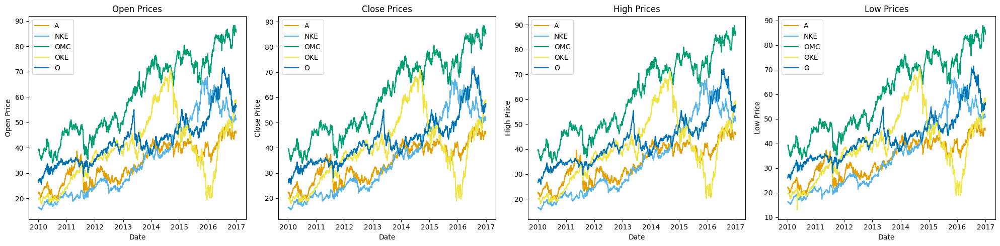

In [9]:
# Function to plot trends of top 5 stocks metrics in a single line
def plot_stock_metrics_in_line(data, stocks, metrics):
    num_metrics = len(metrics)  # Get the number of metrics to be plotted
    fig, axs = plt.subplots(1, num_metrics, figsize=(20, 5))  # Create subplots for each metric, arranged in a single row

    # Color-blind friendly palette (Okabe & Ito)
    color_palette = ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2']  # Orange, Sky Blue, Bluish Green, Yellow, Blue

    for i, metric in enumerate(metrics):  # Iterate over each metric
        for j, stock_name in enumerate(stocks):  # Iterate over each stock symbol
            stock_data = data[data['symbol'] == stock_name]  # Filter data for the current stock symbol
            axs[i].plot(stock_data.index, stock_data[metric], label=stock_name, color=color_palette[j])  # Plot the metric data for the current stock
        axs[i].set_title(f'{metric.capitalize()} Prices')  # Set the title for the subplot
        axs[i].set_xlabel('Date')  # Set the x-axis label
        axs[i].set_ylabel(f'{metric.capitalize()} Price')  # Set the y-axis label
        axs[i].legend(loc='best')  # Add a legend to the subplot

    plt.tight_layout()  # Adjust the layout for better fit
    plt.show()  # Display the plot

# Plot open, close, high, and low for top 5 stocks in a single line
metrics = ['open', 'close', 'high', 'low']  # Define the metrics to be plotted
plot_stock_metrics_in_line(prices_split_adjusted, top_5_stocks, metrics)  # Call the function with the dataset, top 5 stocks, and metrics


In [ ]:
# Volume Analysis
def plot_volume_analysis(data, stocks):
    plt.figure(figsize=(15, 5))  # Initialize the figure with specified dimensions
    for stock_name in stocks:  # # Iterate over each stock symbol
        stock_data = data[data['symbol'] == stock_name] # Filter data for the current stock symbol
        plt.plot(stock_data.index, stock_data['volume'], label=stock_name) # Plot the metric data for the current stock
    plt.title('Volume Traded for Top 5 Stocks')  # Set plot title
    plt.xlabel('Date')  # Set x-axis label
    plt.ylabel('Volume')  # Set y-axis label
    plt.legend(loc='best')  # Add legend to the plot
    plt.show()  # Show the plot

plot_volume_analysis(prices_split_adjusted, top_5_stocks)  # Execute the function with the dataset and top 5 stocks


In [10]:
# Number of data points for 'open' and 'close' prices
n_open = len(prices_split_adjusted['open'])
n_close = len(prices_split_adjusted['close'])

# Calculate number of bins using Sturges' formula
bins_sturges_open = int(1 + np.log2(n_open))
bins_sturges_close = int(1 + np.log2(n_close))

print(f"Sturges' Formula for Opening Prices: Number of bins = {bins_sturges_open}")
print(f"Sturges' Formula for Closing Prices: Number of bins = {bins_sturges_close}")


Sturges' Formula for Opening Prices: Number of bins = 20
Sturges' Formula for Closing Prices: Number of bins = 20


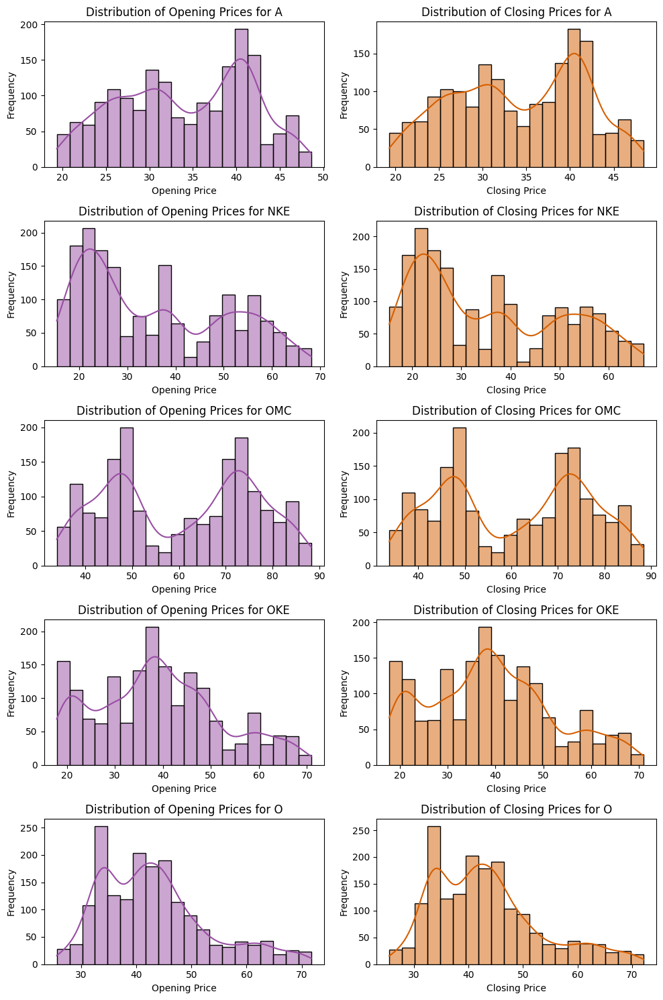

In [12]:
# Distribution of Stock Prices for Open and Close
def plot_distribution(data, stocks):
    # Create a grid of subplots with a number of rows equal to the number of stocks and 2 columns
    fig, axs = plt.subplots(len(stocks), 2, figsize=(10, 15))

    # Use a color-blind friendly palette
    color_palette = ['#984ea3', '#D55E00']  # Blue, Orange from the "Okabe & Ito" palette

    # Loop over each stock symbol and its index
    for i, stock_name in enumerate(stocks):
        stock_data = data[data['symbol'] == stock_name] # Filter the data for the current stock symbol

        # Plot the distribution of opening prices for the current stock
        sns.histplot(stock_data['open'], kde=True, bins=20, ax=axs[i, 0], color=color_palette[0])
        axs[i, 0].set_title(f'Distribution of Opening Prices for {stock_name}')  # Set the title for the subplot
        axs[i, 0].set_xlabel('Opening Price')  # Set the x-axis label
        axs[i, 0].set_ylabel('Frequency')  # Set the y-axis label

        # Plot the distribution of closing prices for the current stock
        sns.histplot(stock_data['close'], kde=True, bins=20, ax=axs[i, 1], color=color_palette[1])
        axs[i, 1].set_title(f'Distribution of Closing Prices for {stock_name}')  # Set the title for the subplot
        axs[i, 1].set_xlabel('Closing Price')  # Set the x-axis label
        axs[i, 1].set_ylabel('Frequency')  # Set the y-axis label

    plt.tight_layout()  # Adjust subplots to fit into the figure area
    plt.show()  # Display the plot

# Execute the function with the dataset and top 5 stocks
plot_distribution(prices_split_adjusted, top_5_stocks)


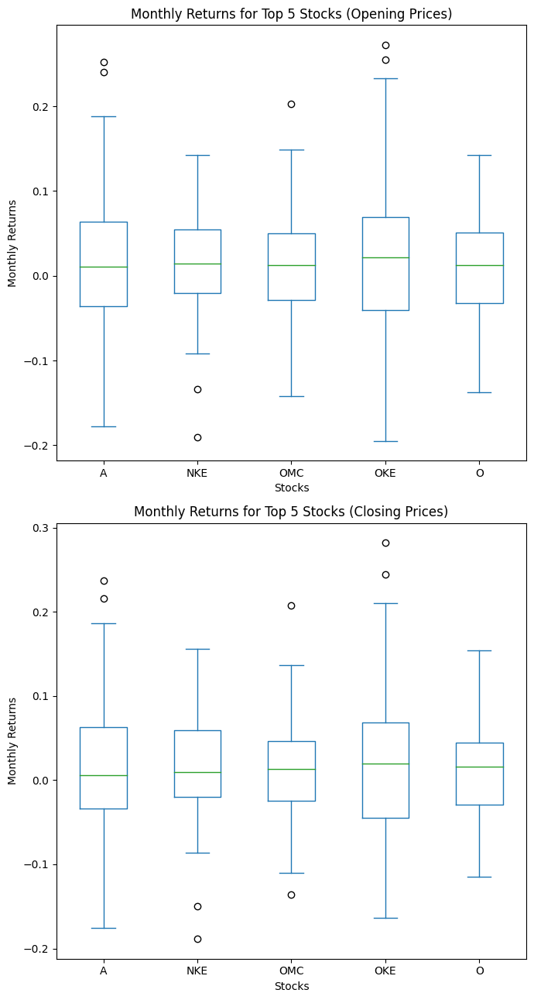

In [20]:
# Monthly Returns Analysis for Open and Close
def plot_monthly_returns(data, stocks):
    # Initialize dictionaries to store monthly returns for open and close prices
    monthly_returns_open = {}
    monthly_returns_close = {}

    # Loop through each stock symbol
    for stock_name in stocks:
        stock_data = data[data['symbol'] == stock_name]  # Filter data for the current stock symbol

        # Calculate monthly returns for opening prices by resampling the data to monthly frequency
        # Use forward fill to handle missing values and then calculate the percentage change
        monthly_returns_open[stock_name] = stock_data['open'].resample('M').ffill().pct_change()

        # Calculate monthly returns for closing prices in a similar manner
        monthly_returns_close[stock_name] = stock_data['close'].resample('M').ffill().pct_change()

    # Convert the dictionaries to DataFrames
    monthly_returns_open_df = pd.DataFrame(monthly_returns_open)
    monthly_returns_close_df = pd.DataFrame(monthly_returns_close)

    # Create subplots for the box plots
    fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 13))

    # Box plot for monthly returns of opening prices
    monthly_returns_open_df.plot(kind='box', ax=axs[0])  # Plot the box plot for monthly returns of opening prices
    axs[0].set_title('Monthly Returns for Top 5 Stocks (Opening Prices)')  # Set the title for the subplot
    axs[0].set_xlabel('Stocks')  # Set the x-axis label
    axs[0].set_ylabel('Monthly Returns')  # Set the y-axis label

    # Box plot for monthly returns of closing prices
    monthly_returns_close_df.plot(kind='box', ax=axs[1])  # Plot the box plot for monthly returns of closing prices
    axs[1].set_title('Monthly Returns for Top 5 Stocks (Closing Prices)')  # Set the title for the subplot
    axs[1].set_xlabel('Stocks')  # Set the x-axis label
    axs[1].set_ylabel('Monthly Returns')  # Set the y-axis label

    plt.tight_layout()  # Adjust subplots to fit into the figure area
    plt.show()  # Display the plot

# Execute the function with the dataset and top 5 stocks
plot_monthly_returns(prices_split_adjusted, top_5_stocks)


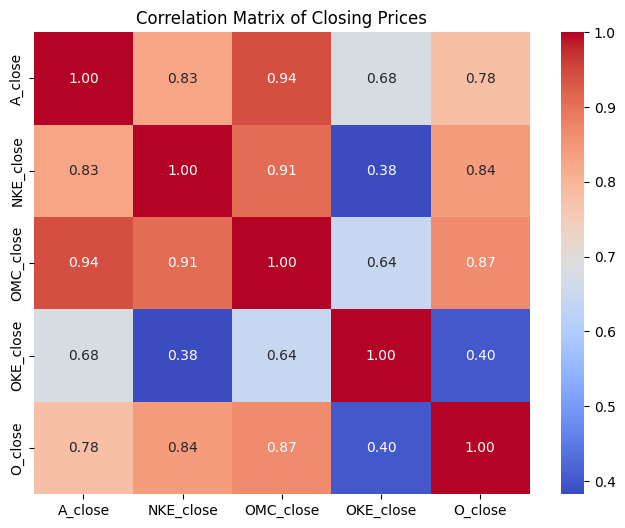

In [21]:
# Correlation Analysis including only close prices
def plot_correlation_matrix_close(data, stocks):
    combined_data = pd.DataFrame()  # Initialize an empty DataFrame to hold the combined data

    # Collect close prices for each stock
    for stock_name in stocks:
        # Filter the data for the current stock and select only the 'close' column
        # Rename the column to include the stock name for distinction
        stock_data = data[data['symbol'] == stock_name][['close']].rename(
            columns={'close': f'{stock_name}_close'})

        # Concatenate the stock data to the combined_data DataFrame along the columns (axis=1)
        combined_data = pd.concat([combined_data, stock_data], axis=1)

    # Calculate the correlation matrix for the combined data
    correlation_matrix = combined_data.corr()

    # Plot heatmap
    plt.figure(figsize=(8, 6))  # Set the figure size
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')  # Create a heatmap with annotations and a coolwarm color map
    plt.title('Correlation Matrix of Closing Prices')  # Set the title of the heatmap
    plt.show()  # Display the plot

# Execute the function with the dataset and top 5 stocks
plot_correlation_matrix_close(prices_split_adjusted, top_5_stocks)


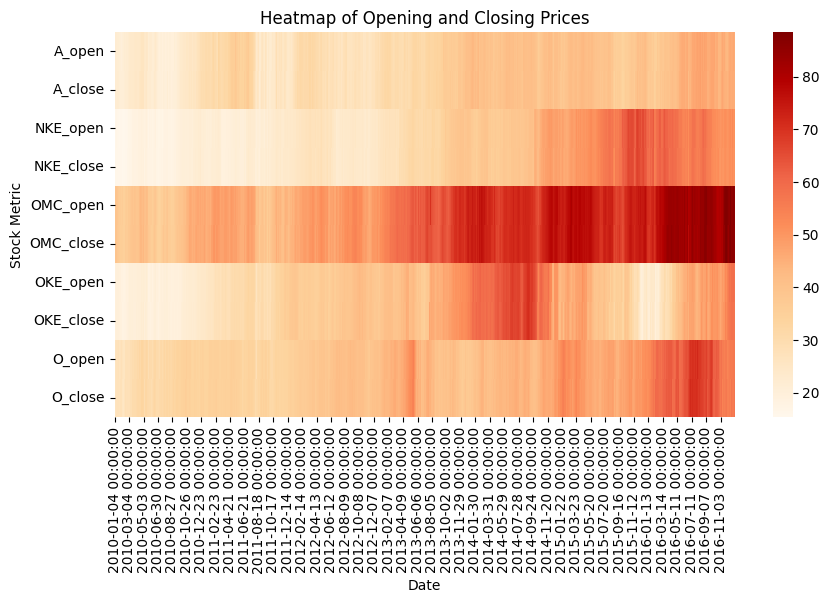

In [22]:
# Heatmap of Opening and Closing Prices
def plot_open_close_prices_heatmap(data, stocks):
    combined_data = pd.DataFrame()  # Initialize an empty DataFrame to hold the combined data

    # Loop over each stock symbol
    for stock_name in stocks:
        stock_open = data[data['symbol'] == stock_name]['open'].rename(f'{stock_name}_open')  # Extract and rename 'open' prices
        stock_close = data[data['symbol'] == stock_name]['close'].rename(f'{stock_name}_close')  # Extract and rename 'close' prices
        combined_data = pd.concat([combined_data, stock_open, stock_close], axis=1)  # Concatenate open and close prices

    plt.figure(figsize=(10, 5))  # Create a figure with the specified size
    sns.heatmap(combined_data.T, cmap='OrRd', cbar=True)  # Plot a heatmap with the specified color map 'OrRd'
    plt.title('Heatmap of Opening and Closing Prices')  # Set the title of the heatmap
    plt.xlabel('Date')  # Set the x-axis label
    plt.ylabel('Stock Metric')  # Set the y-axis label
    plt.show()  # Display the plot

# Execute the function with the dataset and top 5 stocks
plot_open_close_prices_heatmap(prices_split_adjusted, top_5_stocks)


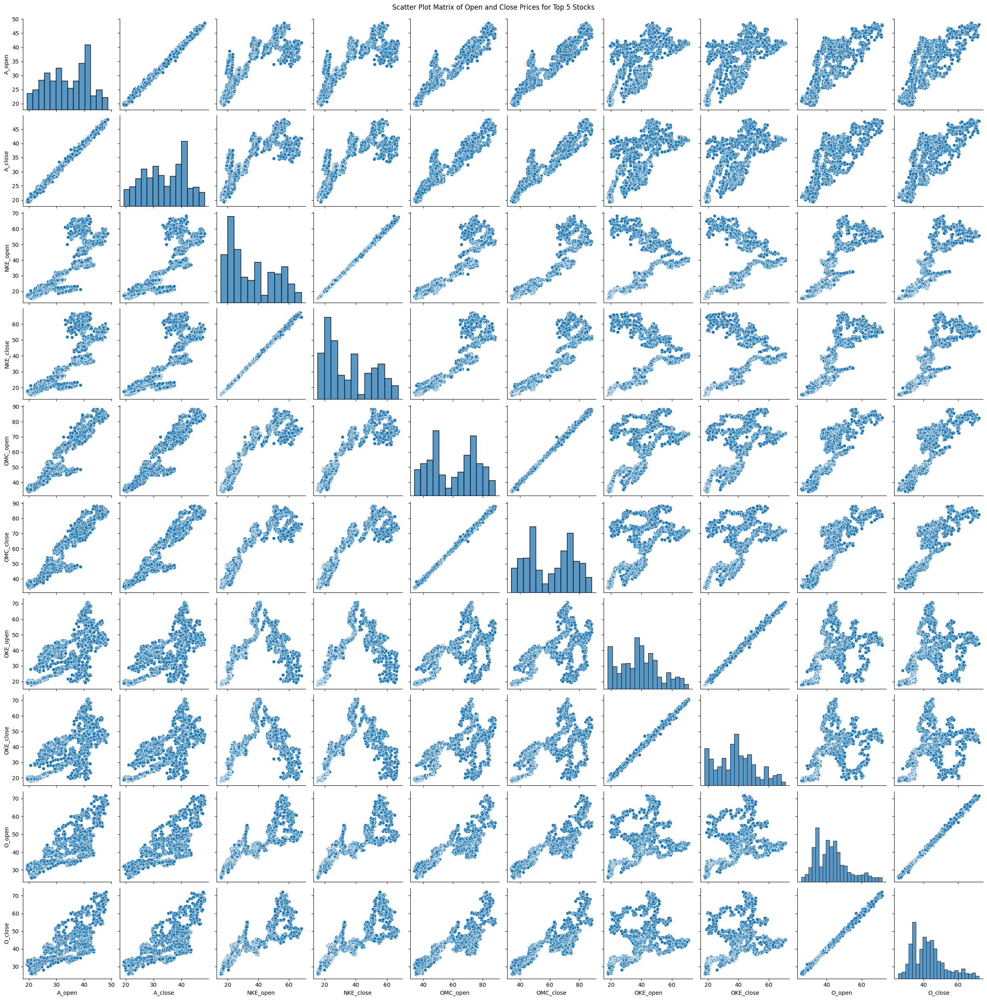

In [23]:
# Scatter Plot Matrix for Open and Close Prices
def plot_scatter_matrix(data, stocks):
    combined_data = pd.DataFrame()  # Initialize an empty DataFrame to hold the combined data

    # Loop over each stock symbol
    for stock_name in stocks:
        # Extract 'open' and 'close' prices for the current stock and rename the columns
        stock_data = data[data['symbol'] == stock_name][['open', 'close']].rename(
            columns={'open': f'{stock_name}_open', 'close': f'{stock_name}_close'})

        # Concatenate the open and close prices for the current stock to the combined_data DataFrame along the columns (axis=1)
        combined_data = pd.concat([combined_data, stock_data], axis=1)

    # Plot scatter plot matrix
    sns.pairplot(combined_data)  # Create a scatter plot matrix of the combined data
    plt.suptitle('Scatter Plot Matrix of Open and Close Prices for Top 5 Stocks', y=1.00)  # Set the title of the plot
    plt.show()  # Display the plot

# Execute the function with the dataset and top 5 stocks
plot_scatter_matrix(prices_split_adjusted, top_5_stocks)


**Data Preprocessing**

In [25]:
# Function to handle missing values
def handle_missing_values(data, stocks):
    handled_data = {}  # Initialize an empty dictionary to store the processed data

    # Loop over each stock symbol
    for stock_name in stocks:
        stock_data = data[data['symbol'] == stock_name].copy()  # Filter and copy the data for the current stock

        # Print the number of missing values before handling
        print(f"Missing values for {stock_name} before handling:")
        print(stock_data.isna().sum())

        # Handle missing values by forward filling and then backward filling
        stock_data.fillna(method='ffill', inplace=True)  # Forward fill missing values
        stock_data.fillna(method='bfill', inplace=True)  # Backward fill any remaining missing values

        # Print the number of missing values after handling
        print(f"Missing values for {stock_name} after handling:")
        print(stock_data.isna().sum())

        # Store the processed data in the dictionary
        handled_data[stock_name] = stock_data

    return handled_data  # Return the dictionary containing the handled data for each stock

# Apply the handling missing values function to the data
handled_data = handle_missing_values(prices_split_adjusted, top_5_stocks)


Missing values for A before handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for A after handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for NKE before handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for NKE after handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for OMC before handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for OMC after handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for OKE before handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for OKE after handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing 

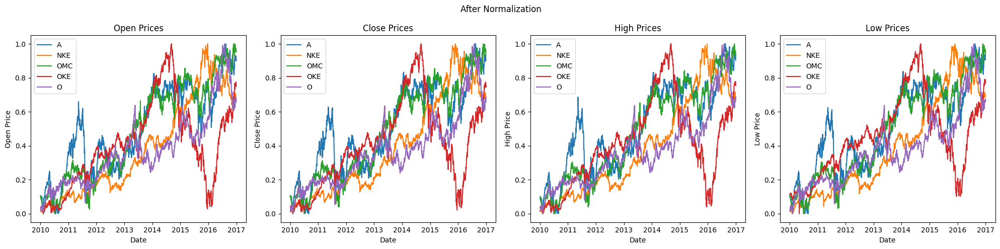

In [26]:
# Function to normalize data
def normalize_data(data, stocks):
    scaler = MinMaxScaler()  # Initialize the MinMaxScaler
    normalized_data = {}  # Initialize an empty dictionary to store normalized data

    # Loop over each stock symbol
    for stock_name in stocks:
        stock_data = data[stock_name].copy()  # Copy the data for the current stock

        # Normalize the 'open', 'close', 'high', and 'low' columns
        stock_data[['open', 'close', 'high', 'low']] = scaler.fit_transform(stock_data[['open', 'close', 'high', 'low']])

        # Store the normalized data in the dictionary
        normalized_data[stock_name] = stock_data

    return normalized_data  # Return the dictionary containing normalized data for each stock

# Function to plot different stock metrics in a single line
def plot_stock_metrics(data, stocks, metrics, title):
    num_metrics = len(metrics)  # Number of metrics to plot
    fig, axs = plt.subplots(1, num_metrics, figsize=(20, 5))  # Create subplots with 1 row and num_metrics columns

    # Loop over each metric and its index
    for i, metric in enumerate(metrics):
        # Loop over each stock symbol
        for stock_name in stocks:
            stock_data = data[stock_name]  # Get the data for the current stock
            axs[i].plot(stock_data.index, stock_data[metric], label=stock_name)  # Plot the metric data for the current stock

        axs[i].set_title(f'{metric.capitalize()} Prices')  # Set the title for the subplot
        axs[i].set_xlabel('Date')  # Set the x-axis label
        axs[i].set_ylabel(f'{metric.capitalize()} Price')  # Set the y-axis label
        axs[i].legend(loc='best')  # Add legend to the subplot

    plt.suptitle(title)  # Set the main title for the plot
    plt.tight_layout()  # Adjust subplots to fit into the figure area
    plt.show()  # Display the plot

# Normalize the data
normalized_data = normalize_data(handled_data, top_5_stocks)

# Plot open, close, high, and low for top 5 stocks after normalization
metrics = ['open', 'close', 'high', 'low']
plot_stock_metrics(normalized_data, top_5_stocks, metrics, 'After Normalization')


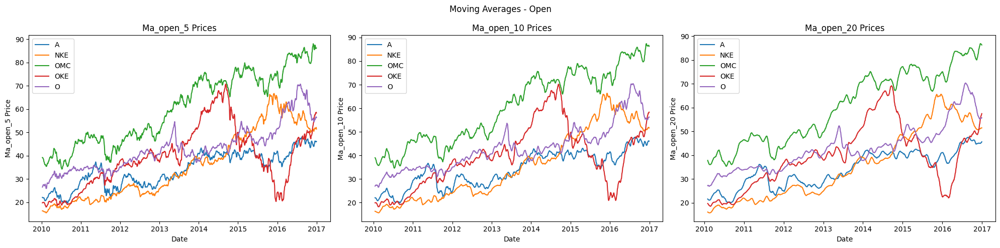

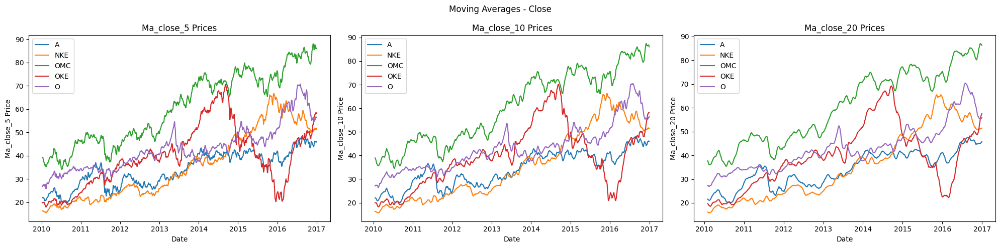

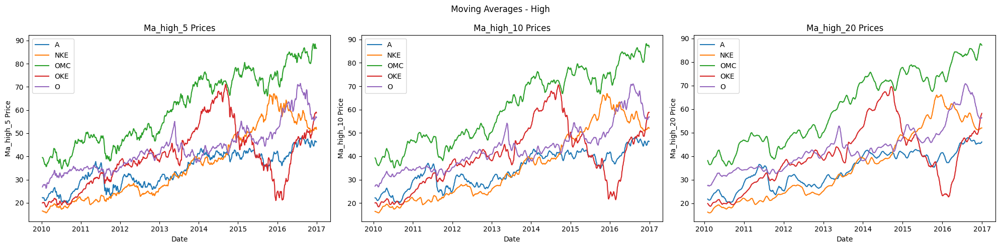

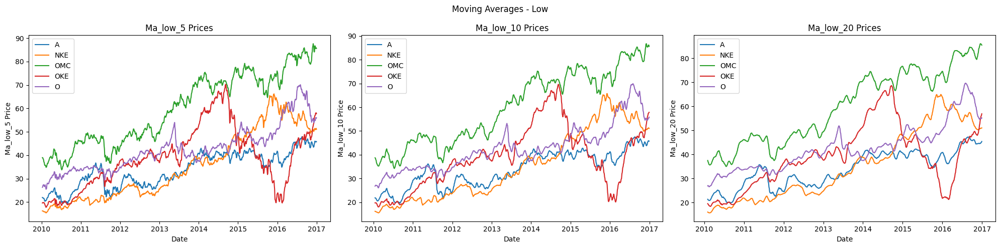

In [27]:
# Function to add moving averages for open, close, high, and low prices for each stock
def add_moving_averages_all_metrics(data, stocks):
    ma_data = {}  # Initialize an empty dictionary to store the moving averages data
    for stock_name in stocks:  # Loop over each stock symbol
        stock_data = data[stock_name].copy()  # Create a copy of the stock data to avoid modifying the original data
        for metric in ['open', 'close', 'high', 'low']:  # Loop over each metric (open, close, high, low)
            # Calculate the 5-day moving average and add it to the stock_data DataFrame
            stock_data[f'MA_{metric}_5'] = stock_data[metric].rolling(window=5).mean()
            # Calculate the 10-day moving average and add it to the stock_data DataFrame
            stock_data[f'MA_{metric}_10'] = stock_data[metric].rolling(window=10).mean()
            # Calculate the 20-day moving average and add it to the stock_data DataFrame
            stock_data[f'MA_{metric}_20'] = stock_data[metric].rolling(window=20).mean()
        ma_data[stock_name] = stock_data  # Store the stock data with moving averages in the ma_data dictionary
    return ma_data  # Return the dictionary containing the moving averages for each stock

# Function to plot moving averages for different stock metrics
def plot_moving_averages(data, stocks, metrics):
    for metric in metrics:  # Loop over each metric
        # Plot the moving averages for the specified metrics using the plot_stock_metrics function
        plot_stock_metrics(data, stocks, [f'MA_{metric}_5', f'MA_{metric}_10', f'MA_{metric}_20'], f'Moving Averages - {metric.capitalize()}')

# Add moving averages for open, close, high, and low prices for the top 5 stocks
ma_data_all_metrics = add_moving_averages_all_metrics(handled_data, top_5_stocks)

# Plot moving averages for open, close, high, and low prices
metrics = ['open', 'close', 'high', 'low']
plot_moving_averages(ma_data_all_metrics, top_5_stocks, metrics)


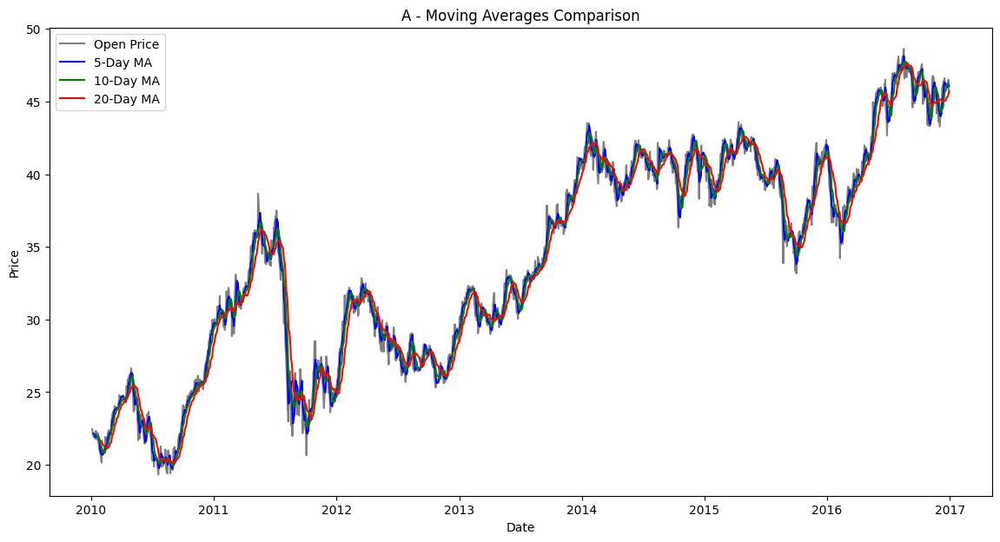

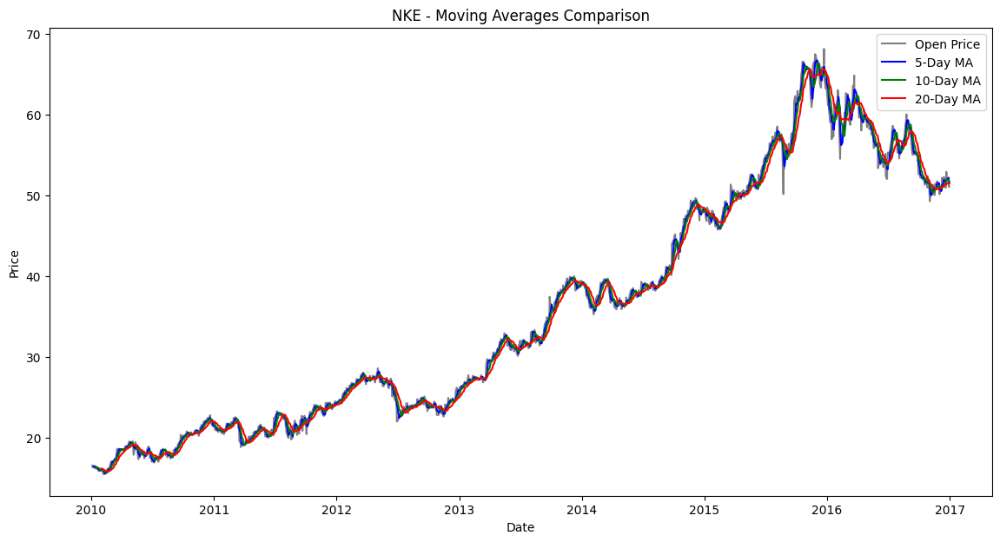

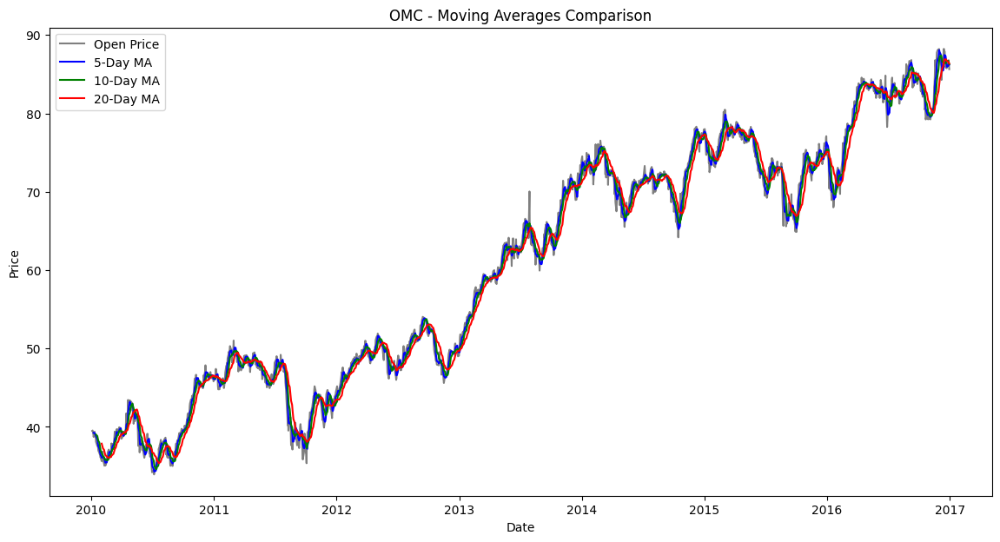

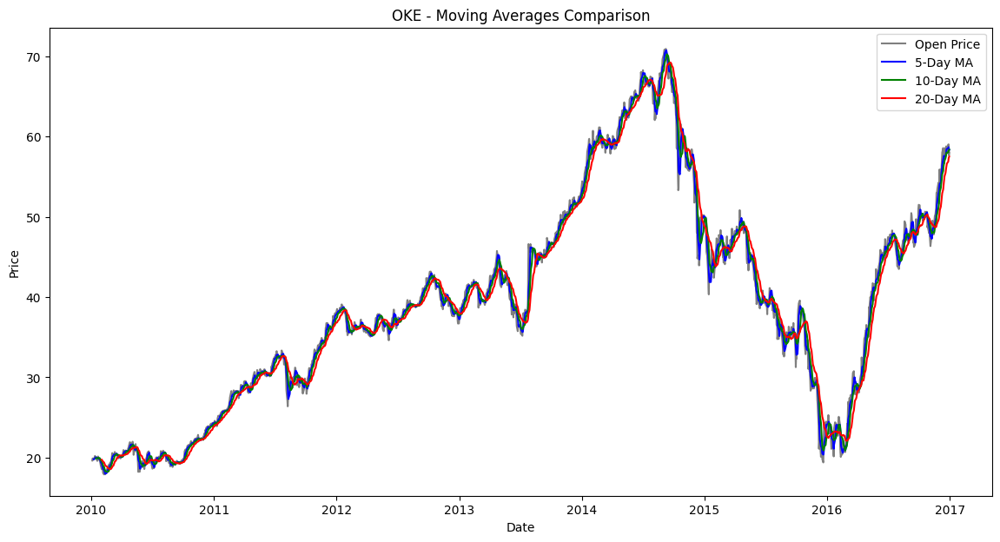

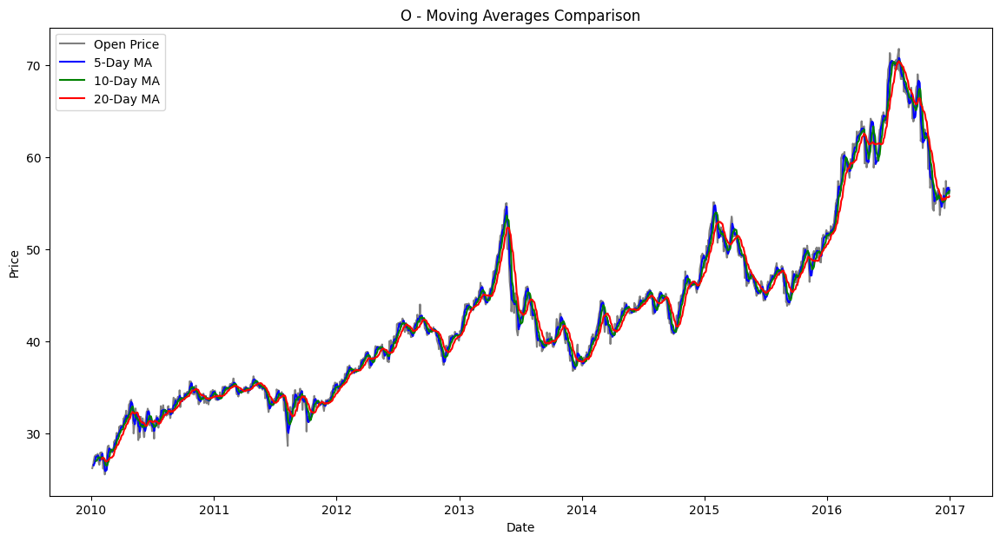

In [29]:
import matplotlib.pyplot as plt

def plot_moving_averages_comparison(stock_data, stock_name):
    plt.figure(figsize=(14, 7))
    plt.plot(stock_data.index, stock_data['open'], label='Open Price', color='black', alpha=0.5)
    plt.plot(stock_data.index, stock_data['MA_open_5'], label='5-Day MA', color='blue')
    plt.plot(stock_data.index, stock_data['MA_open_10'], label='10-Day MA', color='green')
    plt.plot(stock_data.index, stock_data['MA_open_20'], label='20-Day MA', color='red')
    plt.title(f'{stock_name} - Moving Averages Comparison')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

for stock_name in top_5_stocks:
    plot_moving_averages_comparison(ma_data_all_metrics[stock_name], stock_name)


In [31]:
from sklearn.metrics import mean_squared_error

def evaluate_moving_averages(stock_data, metric='open'):
    mse_values = {}
    for window in [5, 10, 20]:
        ma_column = f'MA_{metric}_{window}'
        # Drop missing values from both the actual and the moving average series
        combined_data = pd.concat([stock_data[metric], stock_data[ma_column]], axis=1)
        combined_data.dropna(inplace=True)

        actual = combined_data[metric]
        predicted = combined_data[ma_column]

        if len(actual) == 0 or len(predicted) == 0:
            mse_values[window] = None  # If no data is available, set MSE to None
        else:
            mse = mean_squared_error(actual, predicted)
            mse_values[window] = mse

    return mse_values

# Evaluate and print MSE for each stock
for stock_name in top_5_stocks:
    stock_data = ma_data_all_metrics[stock_name]
    mse_results = evaluate_moving_averages(stock_data)
    print(f'MSE for {stock_name}:', mse_results)


MSE for A: {5: 0.3768517156347736, 10: 0.7975518458934204, 20: 1.633810989363325}
MSE for NKE: {5: 0.35181379067703566, 10: 0.7310754263001055, 20: 1.4173203294496683}
MSE for OMC: {5: 0.6295555039323394, 10: 1.4389004182384226, 20: 3.1243633236383626}
MSE for OKE: {5: 0.702897678316933, 10: 1.707906941603697, 20: 3.6218523297152467}
MSE for O: {5: 0.41227945792430976, 10: 1.0049201757362152, 20: 2.1044571059311243}


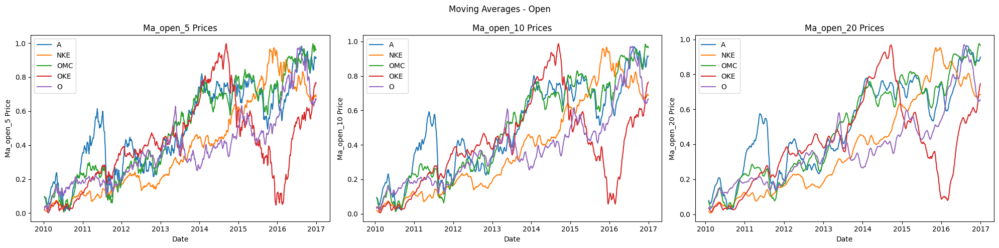

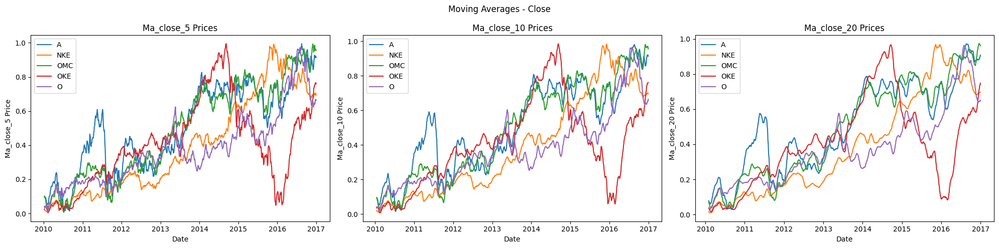

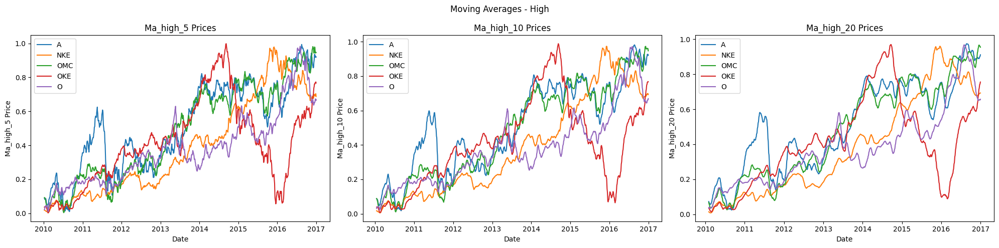

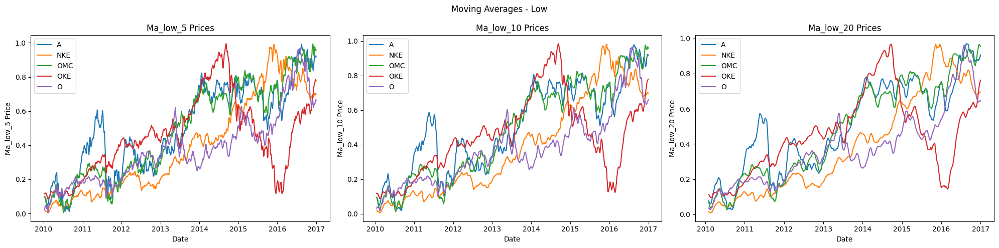

In [20]:
# Function to add moving averages for open, close, high, and low prices for each stock after normalization
def add_moving_averages_all_metrics(data, stocks):
    ma_data = {}  # Initialize an empty dictionary to store the moving averages data
    for stock_name in stocks:  # Loop over each stock symbol
        stock_data = data[stock_name].copy()  # Create a copy of the stock data to avoid modifying the original data
        for metric in ['open', 'close', 'high', 'low']:  # Loop over each metric (open, close, high, low)
            # Calculate the 5-day moving average and add it to the stock_data DataFrame
            stock_data[f'MA_{metric}_5'] = stock_data[metric].rolling(window=5).mean()
            # Calculate the 10-day moving average and add it to the stock_data DataFrame
            stock_data[f'MA_{metric}_10'] = stock_data[metric].rolling(window=10).mean()
            # Calculate the 20-day moving average and add it to the stock_data DataFrame
            stock_data[f'MA_{metric}_20'] = stock_data[metric].rolling(window=20).mean()
        ma_data[stock_name] = stock_data  # Store the stock data with moving averages in the ma_data dictionary
    return ma_data  # Return the dictionary containing the moving averages for each stock

# Function to plot moving averages for different stock metrics
def plot_moving_averages(data, stocks, metrics):
    for metric in metrics:  # Loop over each metric
        # Plot the moving averages for the specified metrics using the plot_stock_metrics function
        plot_stock_metrics(data, stocks, [f'MA_{metric}_5', f'MA_{metric}_10', f'MA_{metric}_20'], f'Moving Averages - {metric.capitalize()}')

# Add moving averages for open, close, high, and low prices for the top 5 stocks
ma_data_all_metrics = add_moving_averages_all_metrics(normalized_data, top_5_stocks)

# Plot moving averages for open, close, high, and low prices
metrics = ['open', 'close', 'high', 'low']
plot_moving_averages(ma_data_all_metrics, top_5_stocks, metrics)


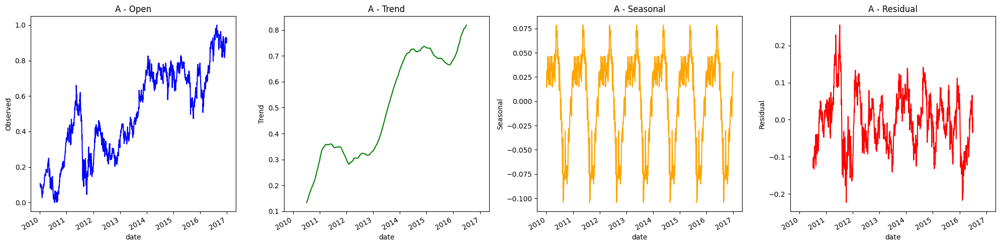

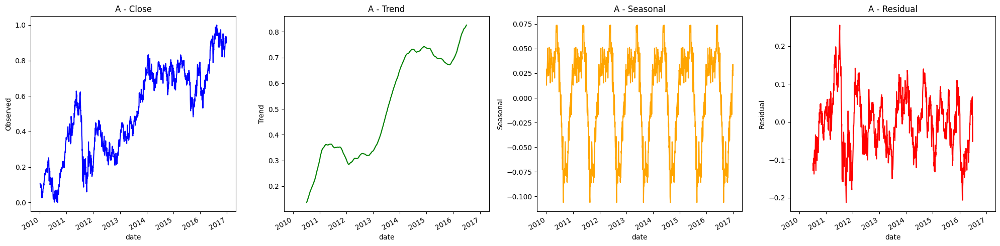

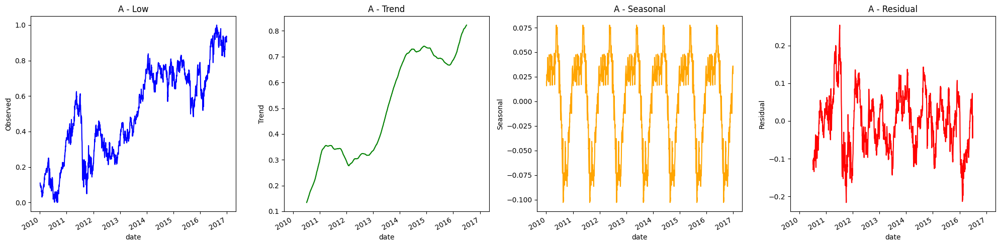

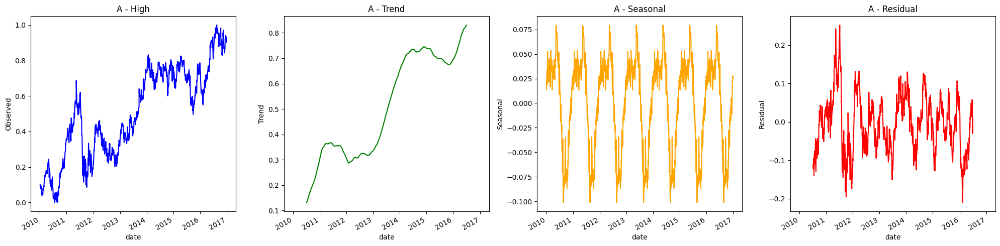

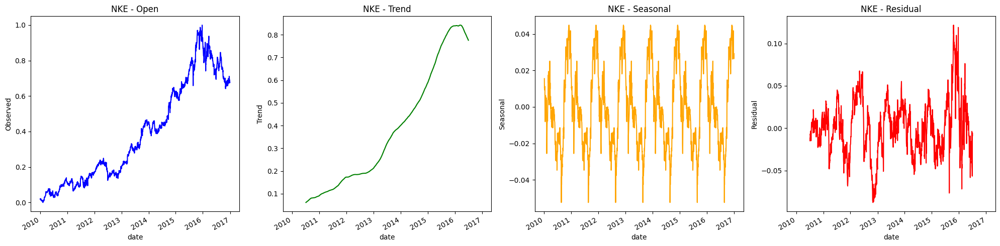

...

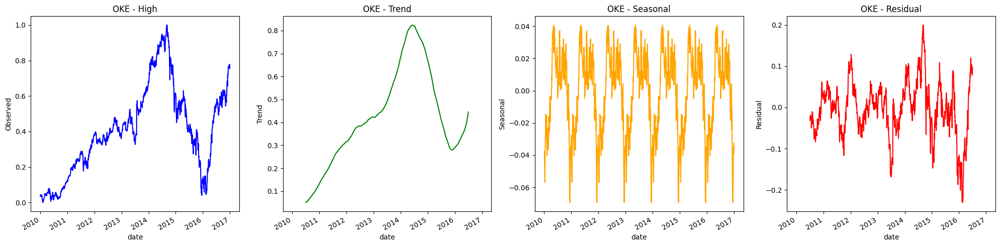

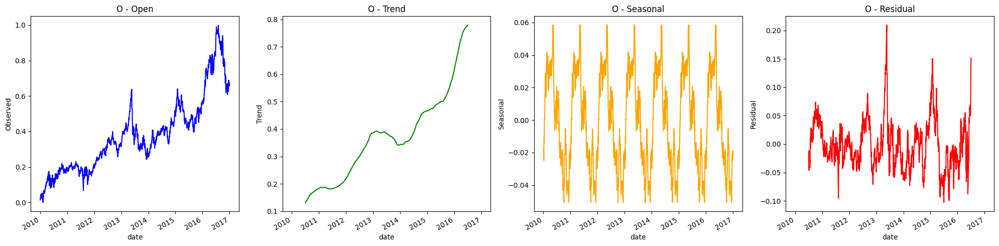

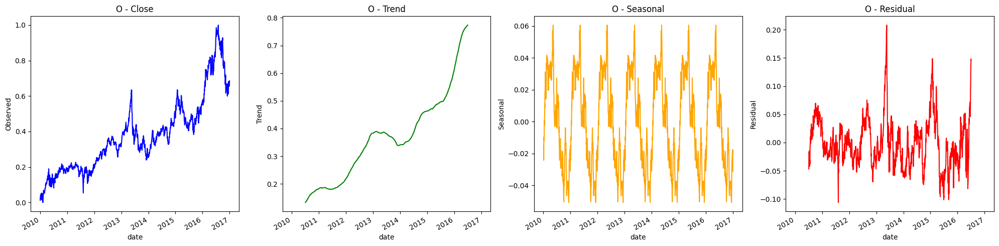

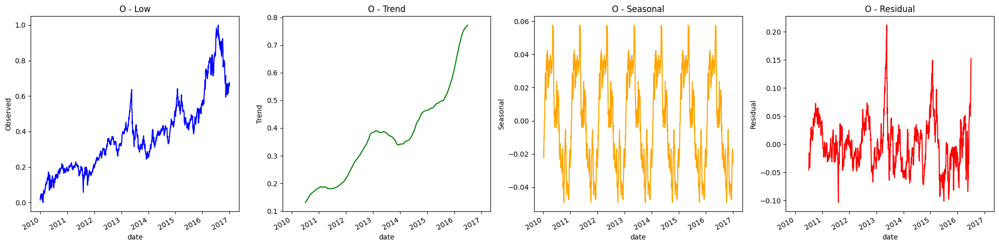

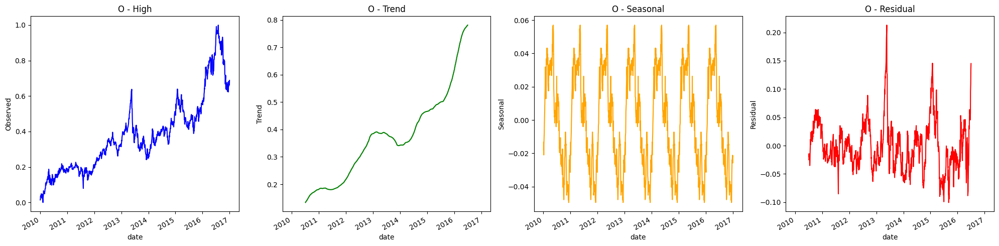

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Dictionary to store decomposed data
decomposed_data = {}

# Function to decompose time series data and store results
def decompose_time_series(data, stock, metric):
    # Perform seasonal decomposition of the time series data using an additive model
    # Using a period of 252 trading days (approx. 1 year of trading days)
    result = seasonal_decompose(data[stock][metric], model='additive', period=252)
    decomposed_data_key = f"{stock}_{metric}"  # Create a unique key for each stock-metric combination

    # Store the decomposed results in the dictionary
    decomposed_data[decomposed_data_key] = {
        'observed': result.observed,
        'trend': result.trend,
        'seasonal': result.seasonal,
        'residual': result.resid
    }

    # Plot the decomposed results
    fig, axs = plt.subplots(1, 4, figsize=(20, 5), sharex=True)  # Create subplots for observed, trend, seasonal, and residual components
    result.observed.plot(ax=axs[0], color='blue')  # Plot the observed data
    axs[0].set_ylabel('Observed')  # Set y-axis label
    axs[0].set_title(f'{stock} - {metric.capitalize()}')  # Set title for the observed plot

    result.trend.plot(ax=axs[1], color='green')  # Plot the trend component
    axs[1].set_ylabel('Trend')  # Set y-axis label
    axs[1].set_title(f'{stock} - Trend')  # Set title for the trend plot

    result.seasonal.plot(ax=axs[2], color='orange')  # Plot the seasonal component
    axs[2].set_ylabel('Seasonal')  # Set y-axis label
    axs[2].set_title(f'{stock} - Seasonal')  # Set title for the seasonal plot

    result.resid.plot(ax=axs[3], color='red')  # Plot the residual component
    axs[3].set_ylabel('Residual')  # Set y-axis label
    axs[3].set_title(f'{stock} - Residual')  # Set title for the residual plot

    plt.tight_layout()  # Adjust the layout to prevent overlap
    plt.show()  # Display the plots

# Decompose the metrics of the top 5 stocks
metrics = ['open', 'close', 'low', 'high']  # Metrics to decompose

# Loop over each stock and each metric to decompose the time series
for stock_name in top_5_stocks:
    for metric in metrics:
        decompose_time_series(normalized_data, stock_name, metric)


**Data Splitting**

In [22]:
from sklearn.model_selection import train_test_split

# Function to split data into training and testing sets
def train_test_split_data(data, seq_length):
    # Initialize empty lists to hold the input sequences (X) and the target values (y)
    X, y = [], []

    # Loop over the data to create sequences of length 'seq_length'
    for i in range(len(data) - seq_length):
        # Append the sequence of length 'seq_length' to X
        X.append(data[i:i+seq_length])
        # Append the target value (the next value after the sequence) to y
        y.append(data[i+seq_length])

    # Convert the lists to numpy arrays for better performance and compatibility with ML models
    X = np.array(X)
    y = np.array(y)

    # Split the data into training and testing sets
    # X contains the input sequences, y contains the target values
    # 20% of the data will be used for testing (test_size=0.2)
    # random_state=42 ensures reproducibility of the split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Return the training and testing sets
    return X_train, X_test, y_train, y_test

**Model Definition**

In [23]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN, LSTM, GRU, Dropout
from tensorflow.keras.optimizers import Adam

def build_model(model_type, input_shape):
    model = Sequential()

    # Add the appropriate RNN, LSTM, or GRU layer based on the model type
    if model_type == 'RNN':
        model.add(SimpleRNN(50, return_sequences=False, input_shape=input_shape))
    elif model_type == 'LSTM':
        model.add(LSTM(50, return_sequences=False, input_shape=input_shape))
    elif model_type == 'GRU':
        model.add(GRU(50, return_sequences=False, input_shape=input_shape))

    # Overfitting prevention: Add a Dropout layer to reduce overfitting
    # Dropout randomly sets a fraction of input units to 0 at each update during training time,
    # which helps prevent overfitting.
    model.add(Dropout(0.2))  # Dropout rate of 20%

    # Add the output layer
    model.add(Dense(1))

    # Compile the model with the Adam optimizer and mean squared error loss function
    # Fine-tuning: Adjusting the learning rate can help improve model performance
    # A smaller learning rate can help the model converge more smoothly.
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])  # MAE for regression tasks

    return model


**Model Training and Model Evaluation**


In [24]:
#Model Training
def train_model(model, X_train, y_train):
    # Train the model with the given training data
    # history stores the training process details such as loss and validation loss for each epoch
    history = model.fit(
        X_train,        # Training data
        y_train,        # Training labels
        epochs=20,      # Number of epochs to train the model
        batch_size=32,  # Number of samples per gradient update
        validation_split=0.2,  # Fraction of the training data to be used as validation data
        verbose=1       # Verbosity mode (1 = progress bar)
    )
    return history  # Return the history object which contains all information collected during training


In [25]:
from sklearn.metrics import mean_squared_error, r2_score

def evaluate_model(model, X_test, y_test):
    # Use the model to make predictions on the test data
    y_pred = model.predict(X_test)

    # Calculate the Mean Squared Error (MSE) between the actual and predicted values
    mse = mean_squared_error(y_test, y_pred)

    # Calculate the R-squared (R2) score, which indicates the proportion of variance explained by the model
    r2 = r2_score(y_test, y_pred)

    # Return the calculated MSE and R2 score
    return mse, r2


In [26]:
import matplotlib.pyplot as plt

def plot_training_history(history, stock_name, title):
    # Create a new figure for plotting with a specified size
    plt.figure(figsize=(10, 4))

    # Plot the training and validation loss
    plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
    plt.plot(history.history['loss'], label='Training Loss')
    if 'val_loss' in history.history:
        plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Training and Validation Loss: {title} for {stock_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot the training and validation MAE
    plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
    plt.plot(history.history['mae'], label='Training MAE')
    if 'val_mae' in history.history:
        plt.plot(history.history['val_mae'], label='Validation MAE')
    plt.title(f'Training and Validation MAE: {title} for {stock_name}')
    plt.xlabel('Epochs')
    plt.ylabel('MAE')
    plt.legend()

    # Adjust layout to prevent overlap between subplots
    plt.tight_layout()

    # Display the plots
    plt.show()


In [27]:
import matplotlib.pyplot as plt

def plot_predicted_vs_actual(model, X_test, y_test, stock_name, title):
    # Use the model to make predictions on the test data
    y_pred = model.predict(X_test)

    # Create a new figure for plotting with specified size
    plt.figure(figsize=(6, 4))

    # Plot the actual stock prices in blue
    plt.plot(y_test, label='Actual', color='blue')

    # Plot the predicted stock prices in red
    plt.plot(y_pred, label='Predicted', color='red')

    # Set the title of the plot, including the title and stock name provided
    plt.title(f'{title} for {stock_name}')

    # Label the x-axis as 'Time'
    plt.xlabel('Time')

    # Label the y-axis as 'Stock Price'
    plt.ylabel('Stock Price')

    # Add a legend to the plot to distinguish between actual and predicted values
    plt.legend()

    # Display the plot
    plt.show()


In [28]:
# Define parameters
seq_length = 20

# Dictionary to store results for each stock and each data type
results = {
    'normalized': {},
    'moving_average': {},
    'decomposed': {}
}

# Dictionary to store metrics
metrics = {
    'normalized': {'RNN': [], 'LSTM': [], 'GRU': []},
    'moving_average': {'RNN': [], 'LSTM': [], 'GRU': []},
    'decomposed': {'RNN': [], 'LSTM': [], 'GRU': []}
}

# Train models for each stock and each data type
for stock_name in top_5_stocks:
    for data_type in ['normalized', 'moving_average', 'decomposed']:
        if data_type == 'normalized':
            data = normalized_data[stock_name]['close'].values.reshape(-1, 1)
        elif data_type == 'moving_average':
            data = ma_data_all_metrics[stock_name]['close'].values.reshape(-1, 1)
        elif data_type == 'decomposed':
            data = decomposed_data[f"{stock_name}_close"]['trend'].dropna().values.reshape(-1, 1)

        X_train, X_test, y_train, y_test = train_test_split_data(data, seq_length)
        input_shape = (X_train.shape[1], 1)

        model_rnn = build_model('RNN', input_shape)
        history_rnn = train_model(model_rnn, X_train, y_train)
        mse_rnn, r2_rnn = evaluate_model(model_rnn, X_test, y_test)
        metrics[data_type]['RNN'].append((mse_rnn, r2_rnn))

        model_lstm = build_model('LSTM', input_shape)
        history_lstm = train_model(model_lstm, X_train, y_train)
        mse_lstm, r2_lstm = evaluate_model(model_lstm, X_test, y_test)
        metrics[data_type]['LSTM'].append((mse_lstm, r2_lstm))

        model_gru = build_model('GRU', input_shape)
        history_gru = train_model(model_gru, X_train, y_train)
        mse_gru, r2_gru = evaluate_model(model_gru, X_test, y_test)
        metrics[data_type]['GRU'].append((mse_gru, r2_gru))

        # Store the models and data for later evaluation and plotting
        results[data_type][stock_name] = {
            'RNN': (model_rnn, history_rnn, X_test, y_test, f'RNN - {data_type.capitalize()} Data'),
            'LSTM': (model_lstm, history_lstm, X_test, y_test, f'LSTM - {data_type.capitalize()} Data'),
            'GRU': (model_gru, history_gru, X_test, y_test, f'GRU - {data_type.capitalize()} Data')
        }


Epoch 1/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2305 - mae: 0.3409 - val_loss: 0.0036 - val_mae: 0.0501
Epoch 2/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0130 - mae: 0.0846 - val_loss: 0.0016 - val_mae: 0.0298
Epoch 3/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0065 - mae: 0.0599 - val_loss: 0.0015 - val_mae: 0.0303
Epoch 4/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0056 - mae: 0.0576 - val_loss: 0.0014 - val_mae: 0.0276
Epoch 5/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0045 - mae: 0.0504 - val_loss: 0.0022 - val_mae: 0.0396
Epoch 6/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0051 - mae: 0.0543 - val_loss: 0.0014 - val_mae: 0.0297
Epoch 7/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0047 - mae: 0.0511 - val_loss: 0.0019 - val_mae: 0.0359
Epoch 8/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0040 - mae: 0.0493 - val_loss: 9.9219e-04 - val_mae: 0.0240
Epoch 9/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.00

In [29]:
# Sample check to see if normalized_data contains data for each stock
print(normalized_data.keys())
# Verify if GRU models are in the results dictionary
for stock_name in top_5_stocks:
    print(stock_name, ":", results['normalized'].get(stock_name, {}).get('GRU', 'No GRU model found'))


dict_keys(['A', 'NKE', 'OMC', 'OKE', 'O'])
A : (<Sequential name=sequential_2, built=True>, <keras.src.callbacks.history.History object at 0x7f63614bf460>, array([[[0.25841047],
        [0.26626343],
        [0.2402506 ],
        ...,
        [0.20589402],
        [0.20319458],
        [0.17521851]],

       [[0.79141053],
        [0.784892  ],
        [0.77254141],
        ...,
        [0.62844995],
        [0.62501909],
        [0.60923768]],

       [[0.60099455],
        [0.59854055],
        [0.58676123],
        ...,
        [0.59485949],
        [0.59068767],
        [0.56639259]],

       ...,

       [[0.31951611],
        [0.35092786],
        [0.3651613 ],
        ...,
        [0.44467222],
        [0.42135883],
        [0.41399671]],

       [[0.49301685],
        [0.5020968 ],
        [0.52541021],
        ...,
        [0.51780256],
        [0.51952041],
        [0.49964268]],

       [[0.44369055],
        [0.45890568],
        [0.43240199],
        ...,
        [0.366879

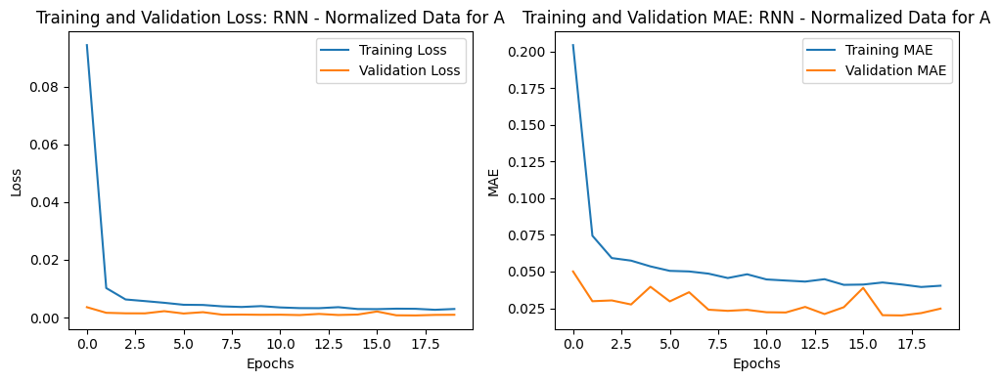

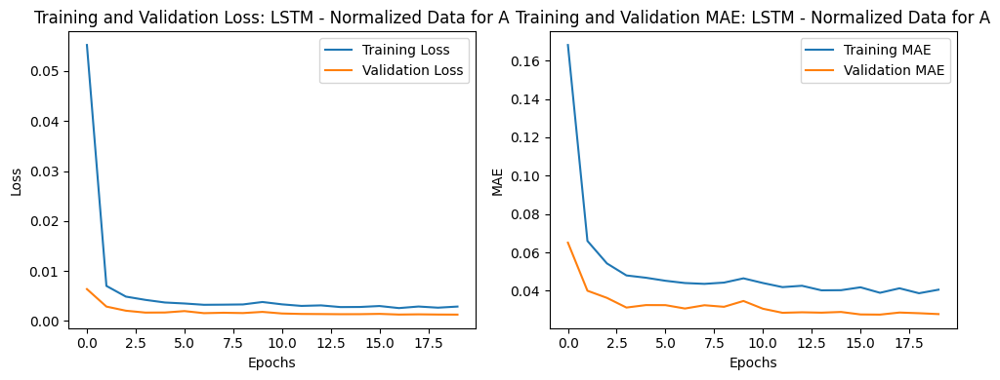

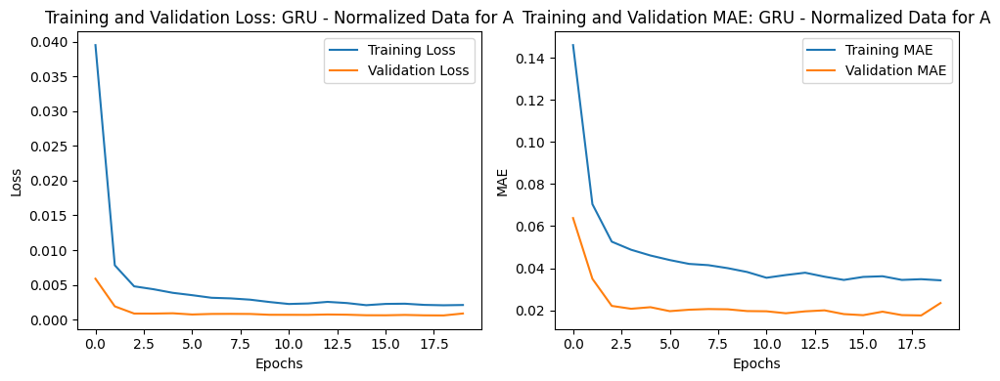

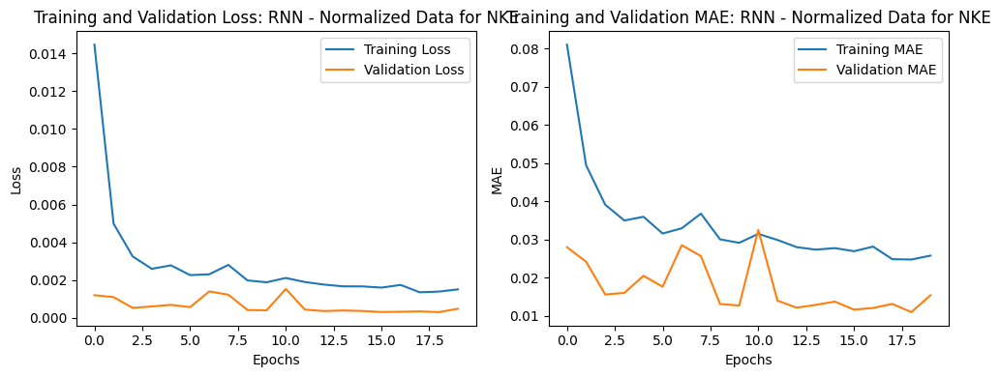

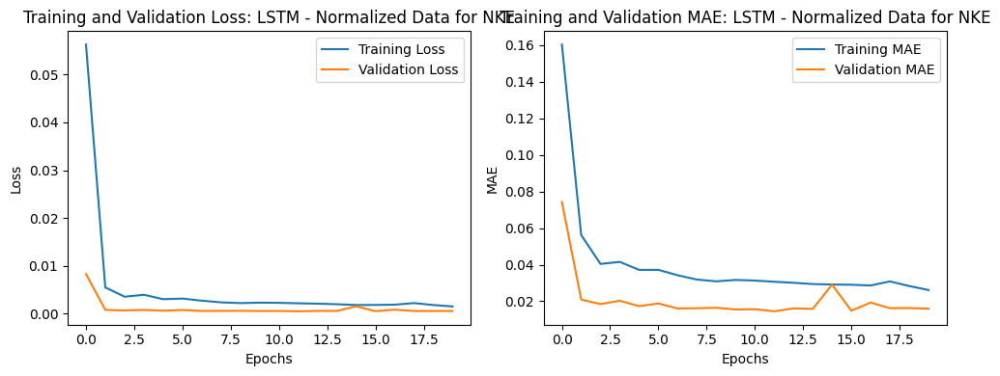

...

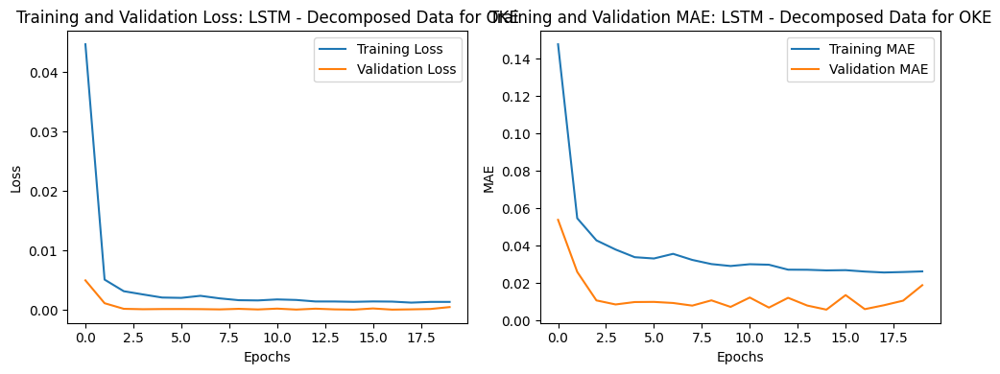

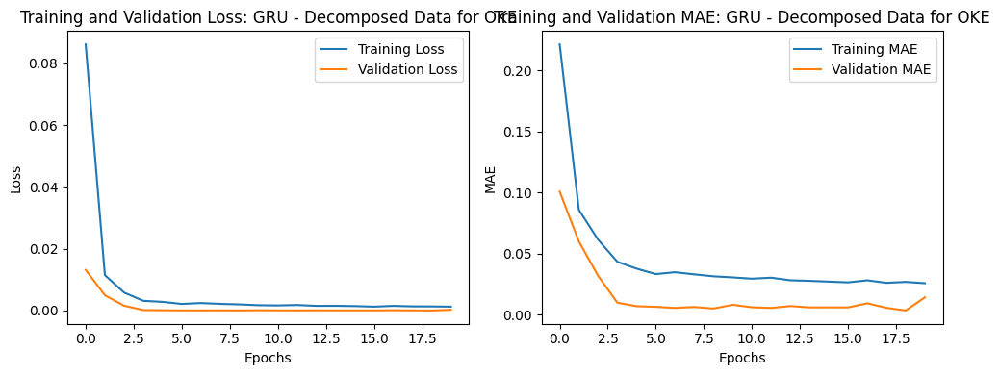

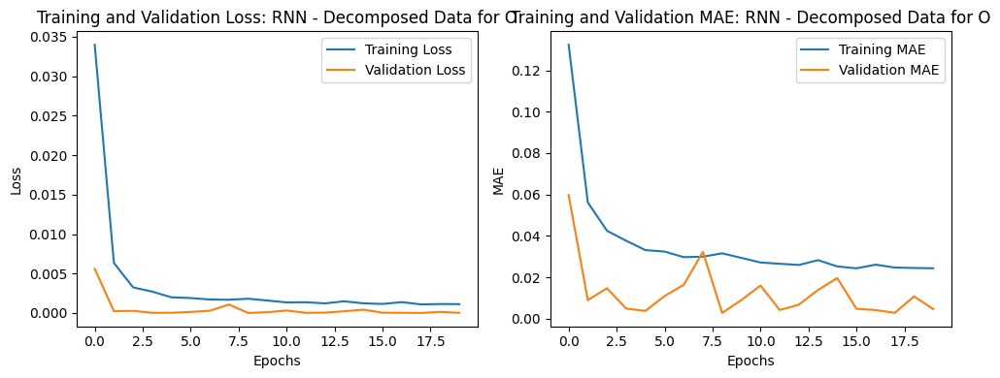

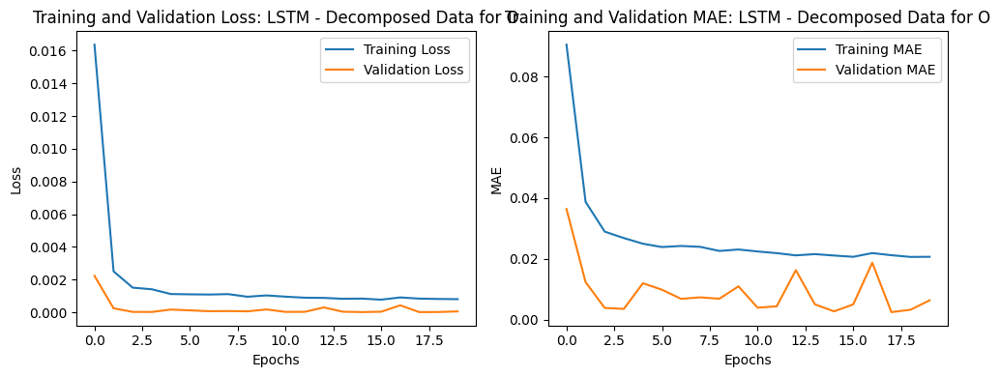

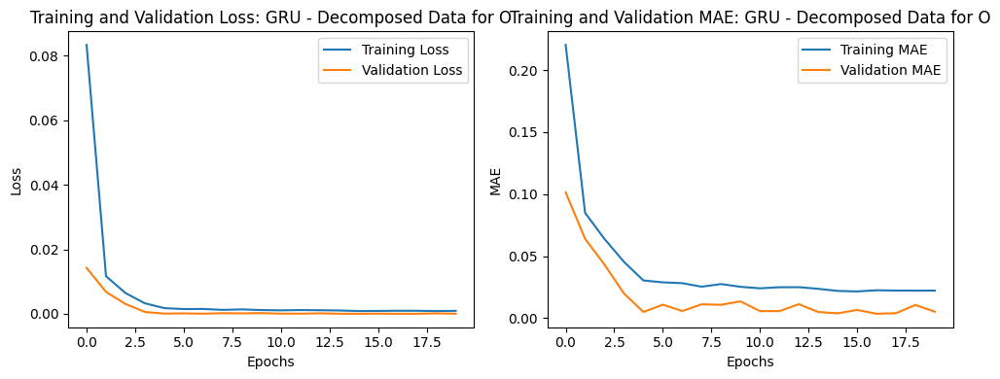

In [30]:
# Plot training history for each stock and each model type
for data_type, stocks in results.items():
    for stock_name, models in stocks.items():
        for model_type, (model, history, X_test, y_test, title) in models.items():
            plot_training_history(history, stock_name, title)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


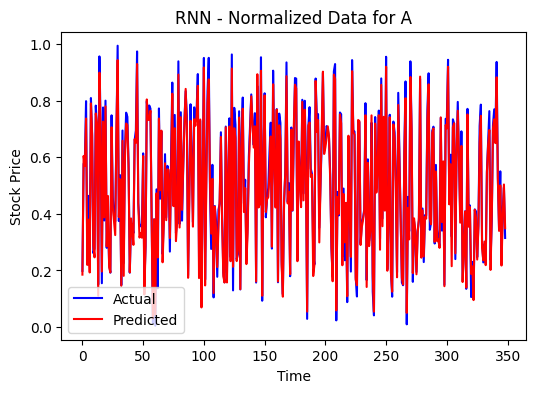

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


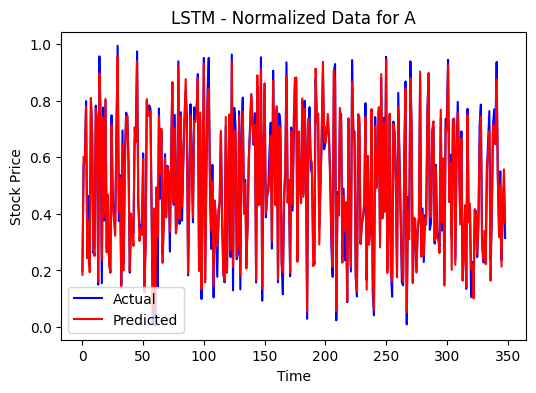

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


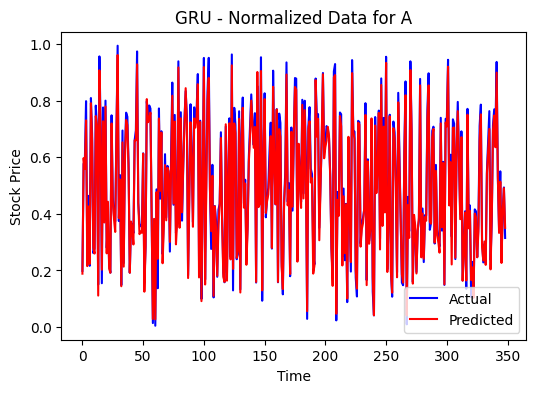

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


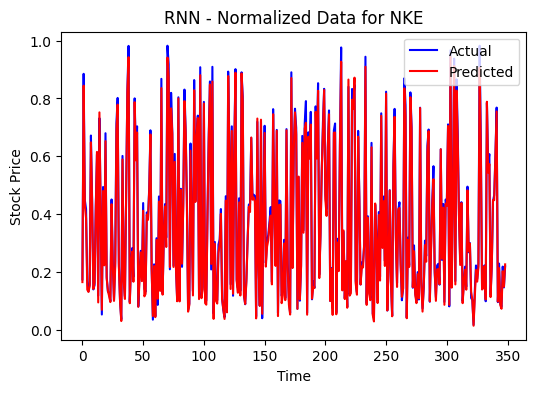

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


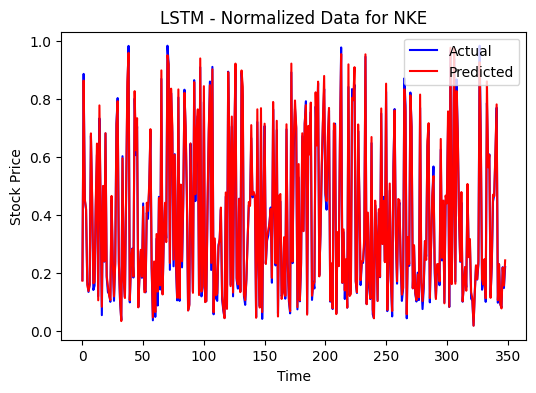

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


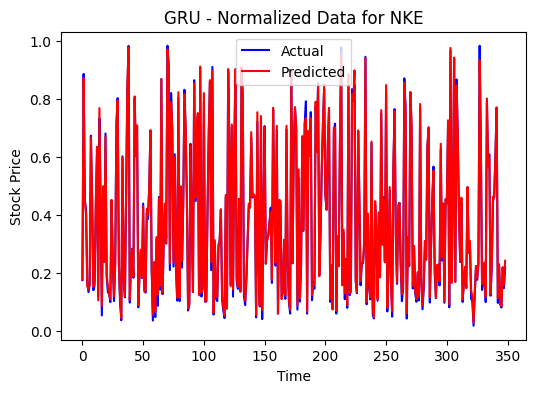

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


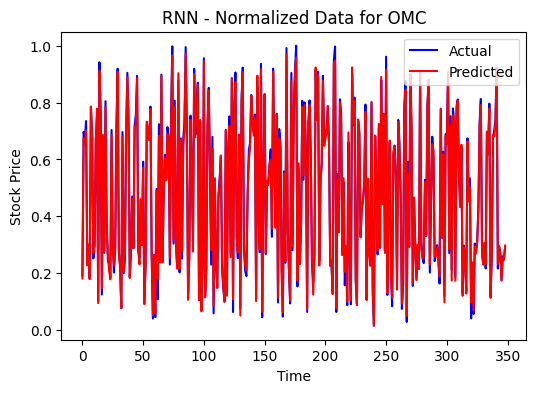

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


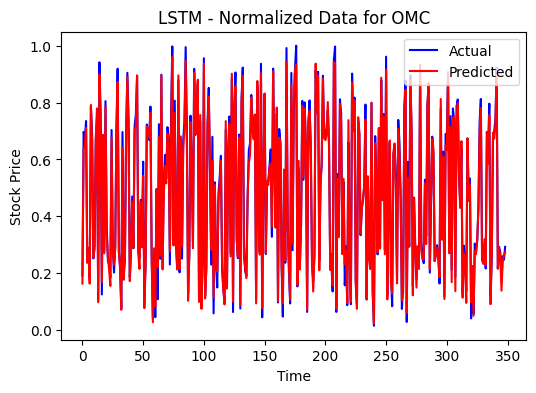

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


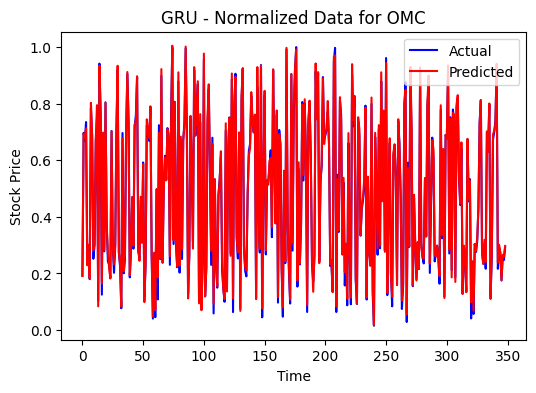

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


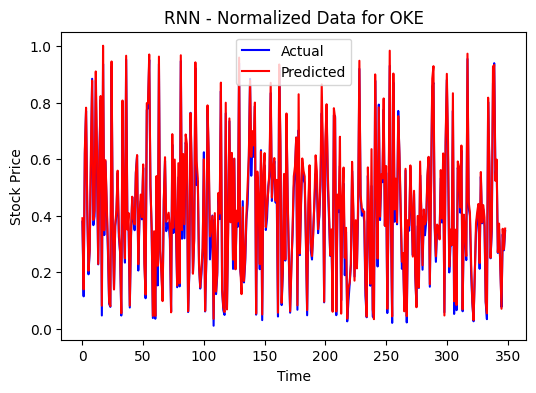

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


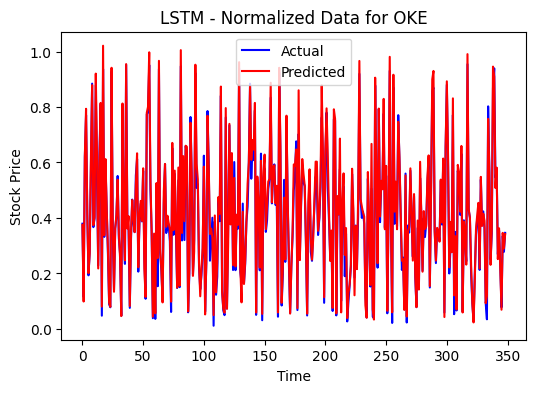

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


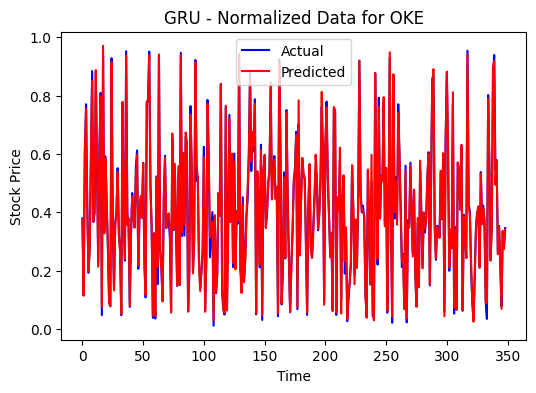

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


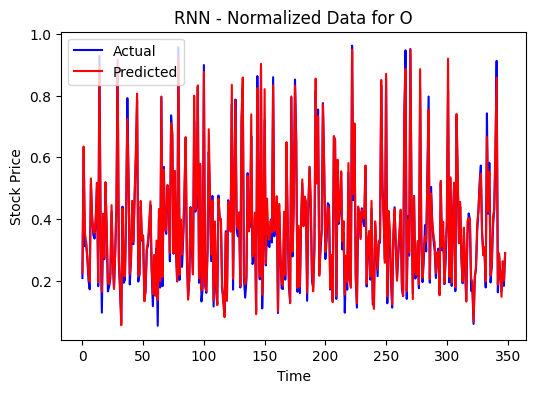

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


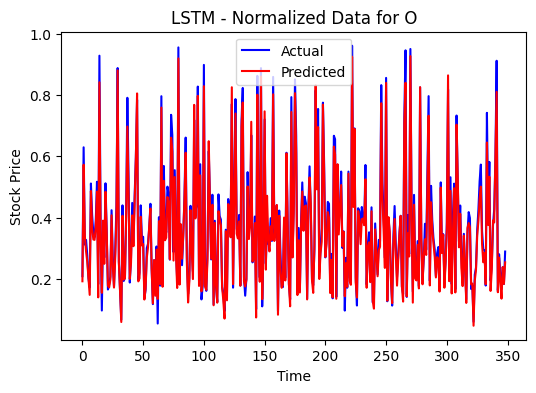

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


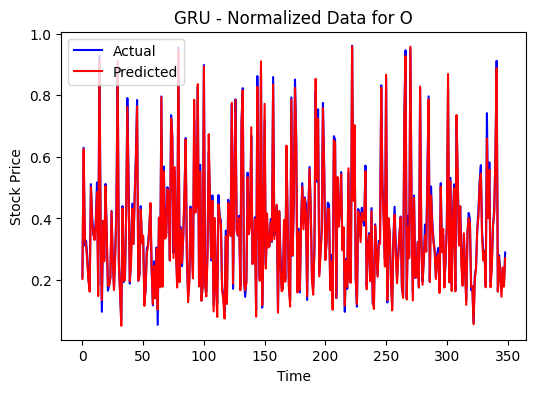

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


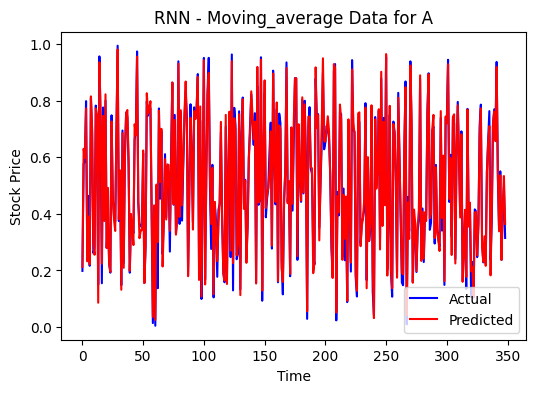

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


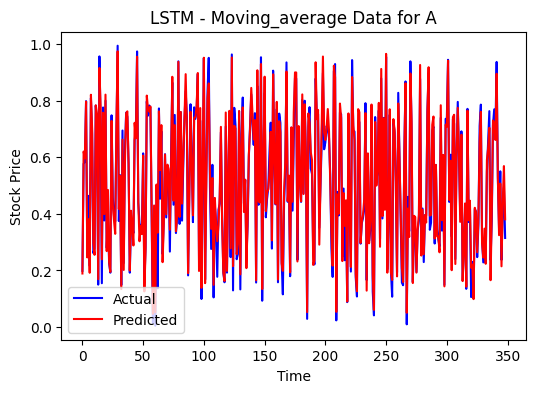

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


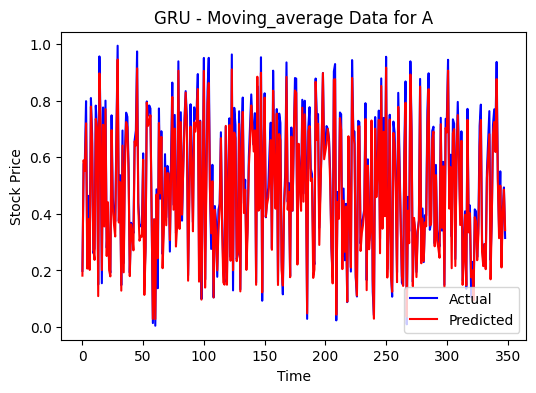

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


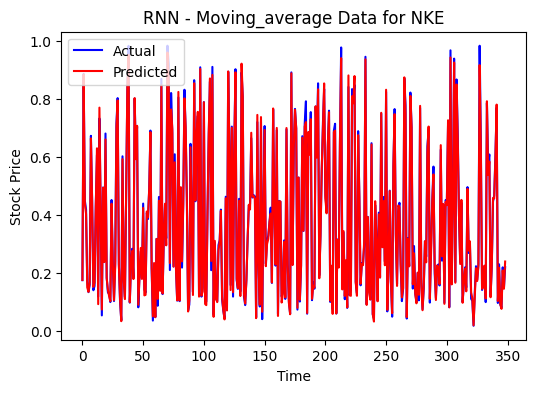

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


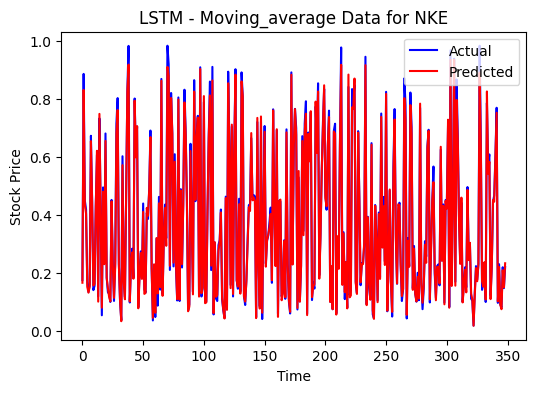

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


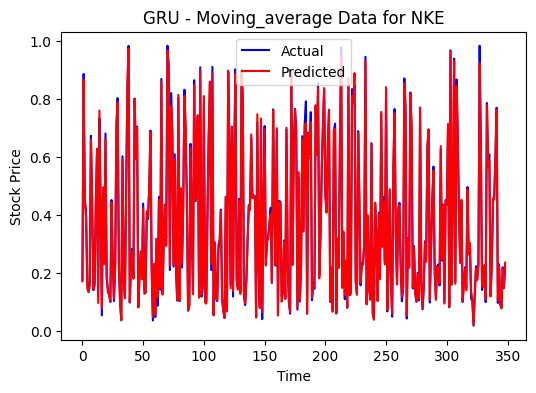

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


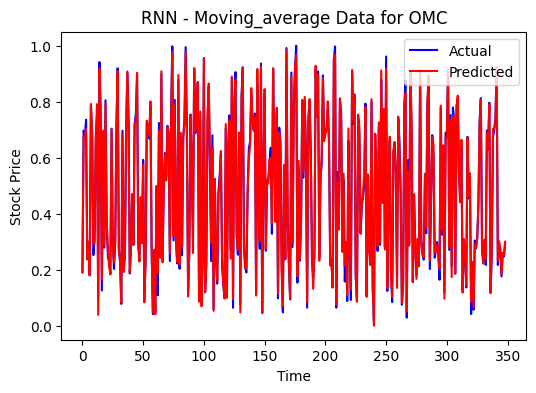

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


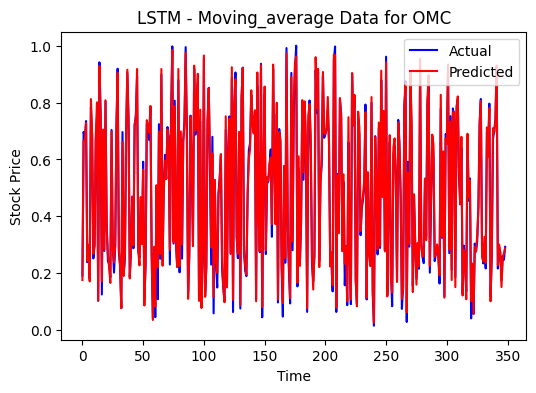

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


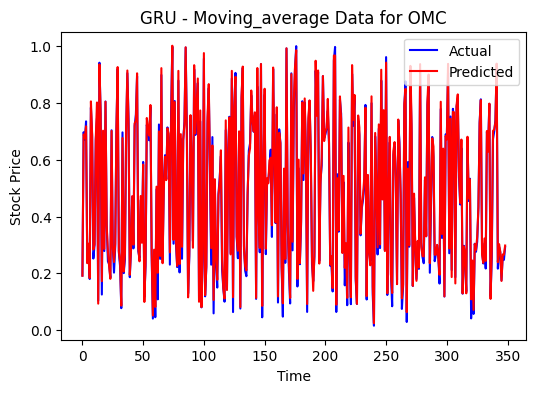

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


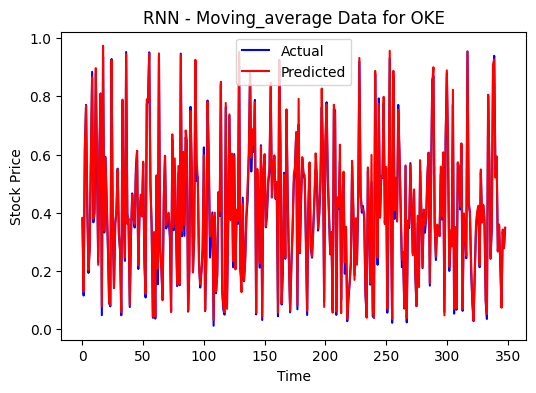

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


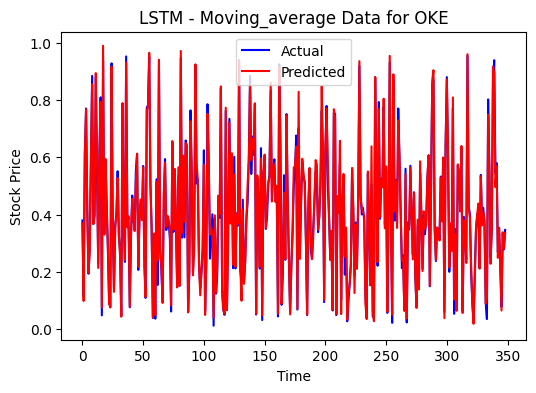

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


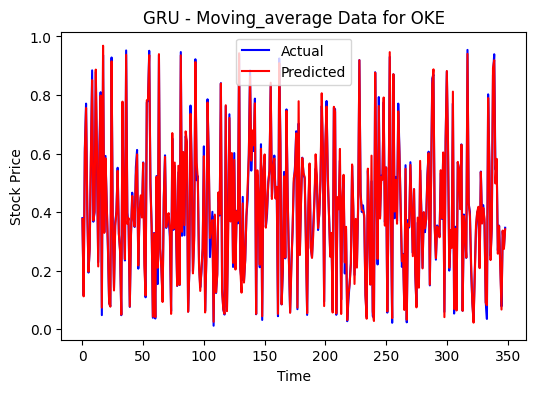

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


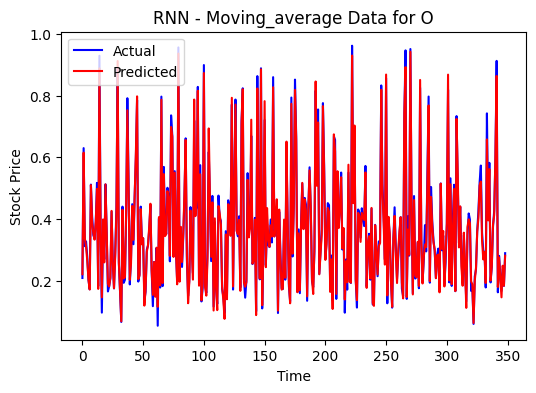

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


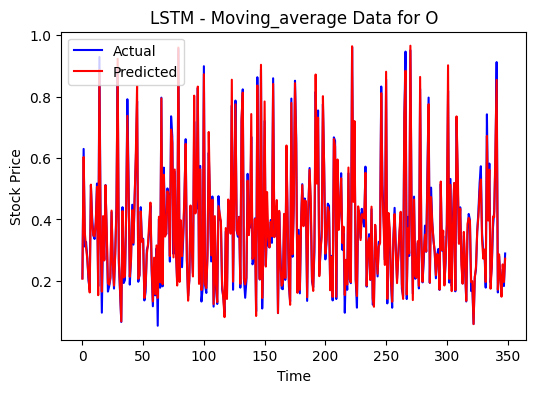

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


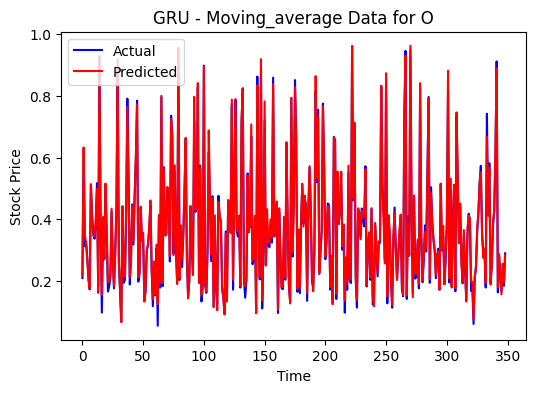

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


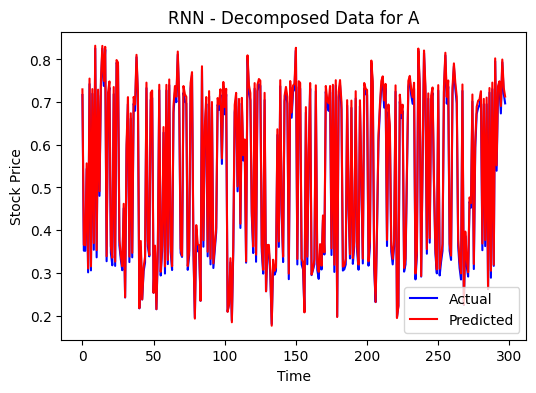

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


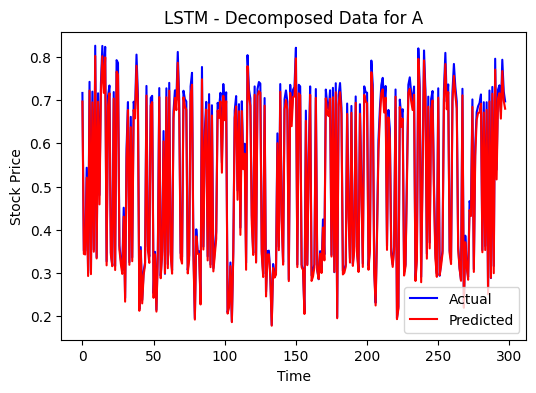

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


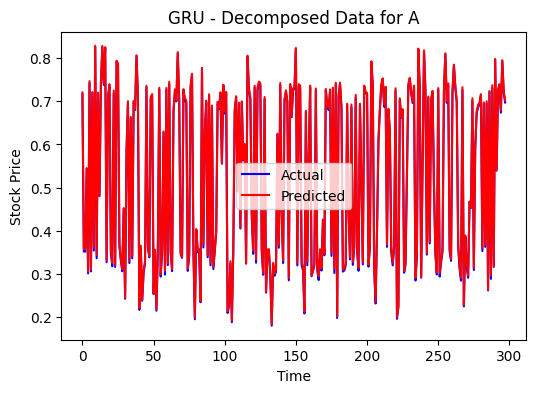

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


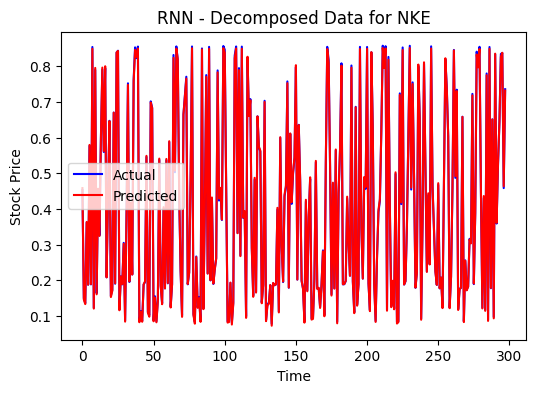

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


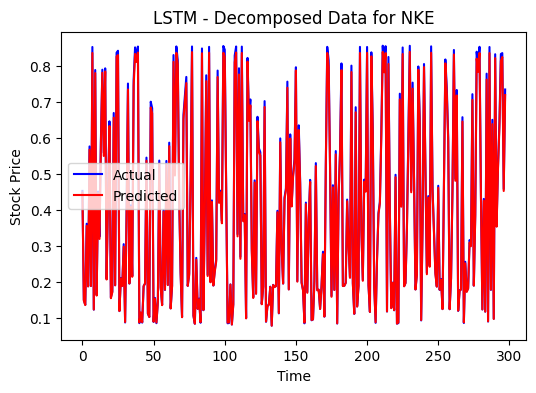

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


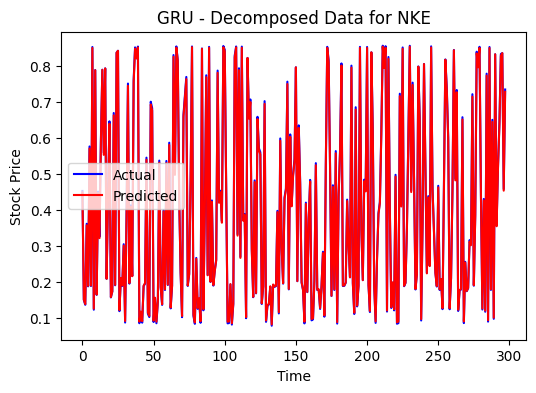

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


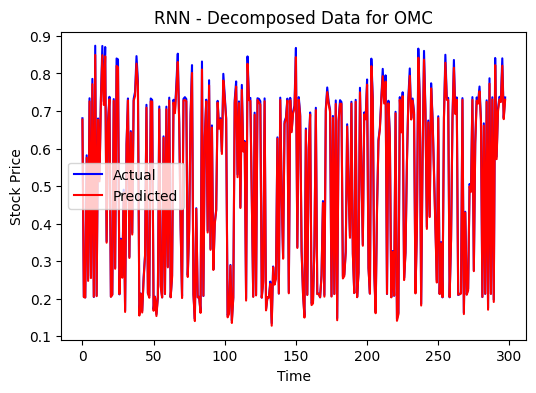

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


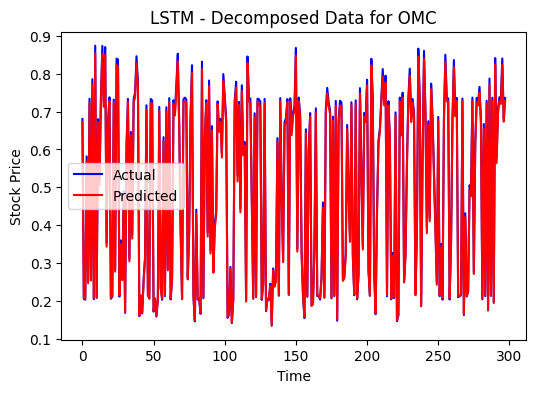

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


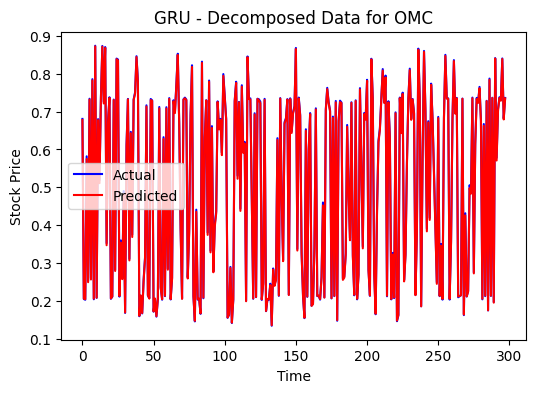

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


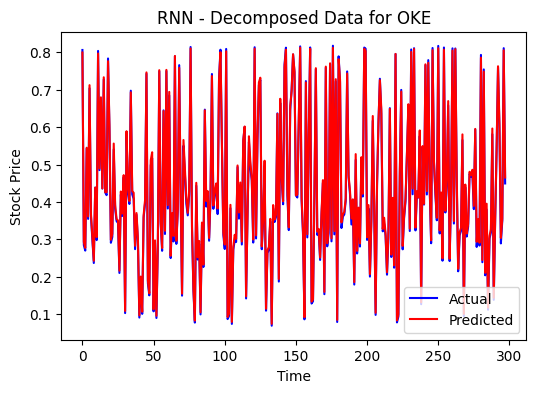

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


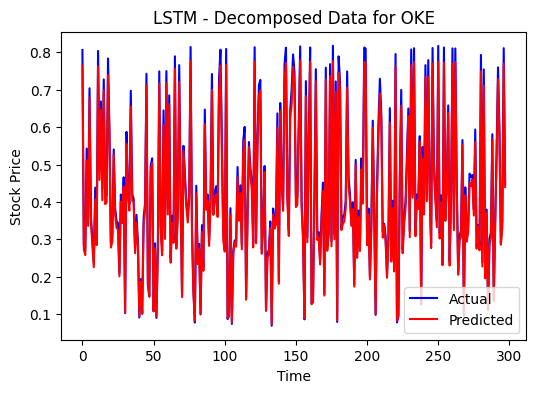

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


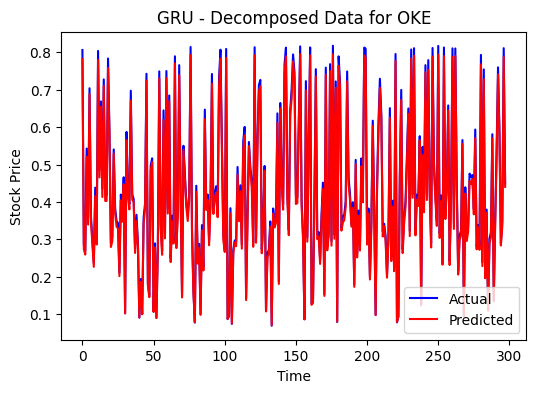

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


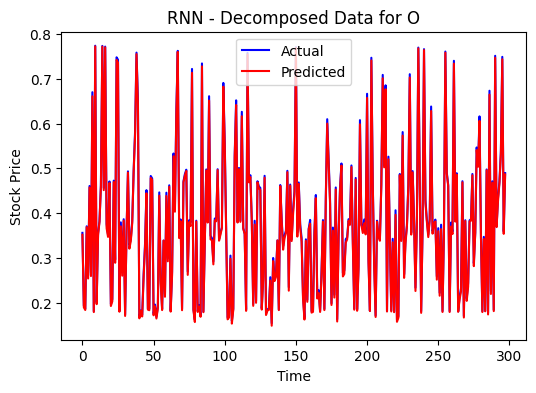

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


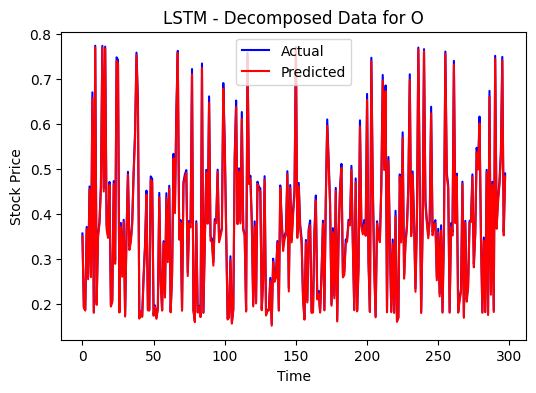

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


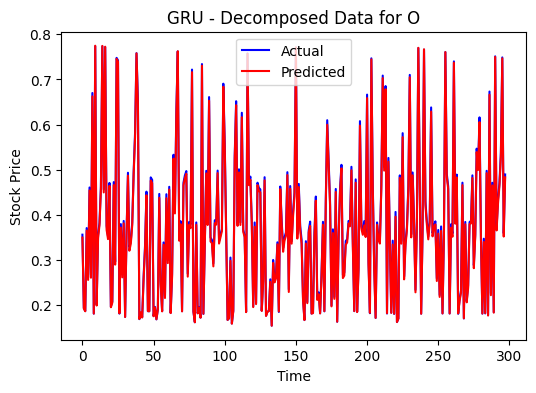

In [31]:
# Plot training history for each stock, each model type, and each data type
for data_type, stocks in results.items():
    for stock_name, models in stocks.items():
        for model_type, (model, history, X_test, y_test, title) in models.items():
            plot_predicted_vs_actual(model, X_test, y_test, stock_name, title)

In [32]:
import numpy as np

def calculate_average_metrics(metrics):
    average_metrics = {}
    for data_type, models in metrics.items():
        average_metrics[data_type] = {}
        for model_type, values in models.items():
            mse_values = [x[0] for x in values]
            r2_values = [x[1] for x in values]
            average_mse = np.mean(mse_values)
            average_r2 = np.mean(r2_values)
            average_metrics[data_type][model_type] = (average_mse, average_r2)
    return average_metrics

# Calculate average metrics
average_metrics = calculate_average_metrics(metrics)

# Print average metrics
for data_type, models in average_metrics.items():
    print(f"\nAverage Metrics for {data_type.capitalize()} Data:")
    for model_type, (avg_mse, avg_r2) in models.items():
        print(f"  {model_type} - Average MSE: {avg_mse}, Average R²: {avg_r2}")



Average Metrics for Normalized Data:
  RNN - Average MSE: 0.0006145162535187837, Average R²: 0.9890509299907055
  LSTM - Average MSE: 0.0008906981328928698, Average R²: 0.984202996341479
  GRU - Average MSE: 0.0003896090086776266, Average R²: 0.9933448093788257

Average Metrics for Moving_average Data:
  RNN - Average MSE: 0.0004630990713022599, Average R²: 0.9920084987427538
  LSTM - Average MSE: 0.0007188537097487333, Average R²: 0.9876548092474504
  GRU - Average MSE: 0.0005453716024938765, Average R²: 0.9907893347220323

Average Metrics for Decomposed Data:
  RNN - Average MSE: 6.597132187222581e-05, Average R²: 0.9984156682586857
  LSTM - Average MSE: 0.00020133379271247177, Average R²: 0.995241448978134
  GRU - Average MSE: 6.401934367328641e-05, Average R²: 0.9984007472708323


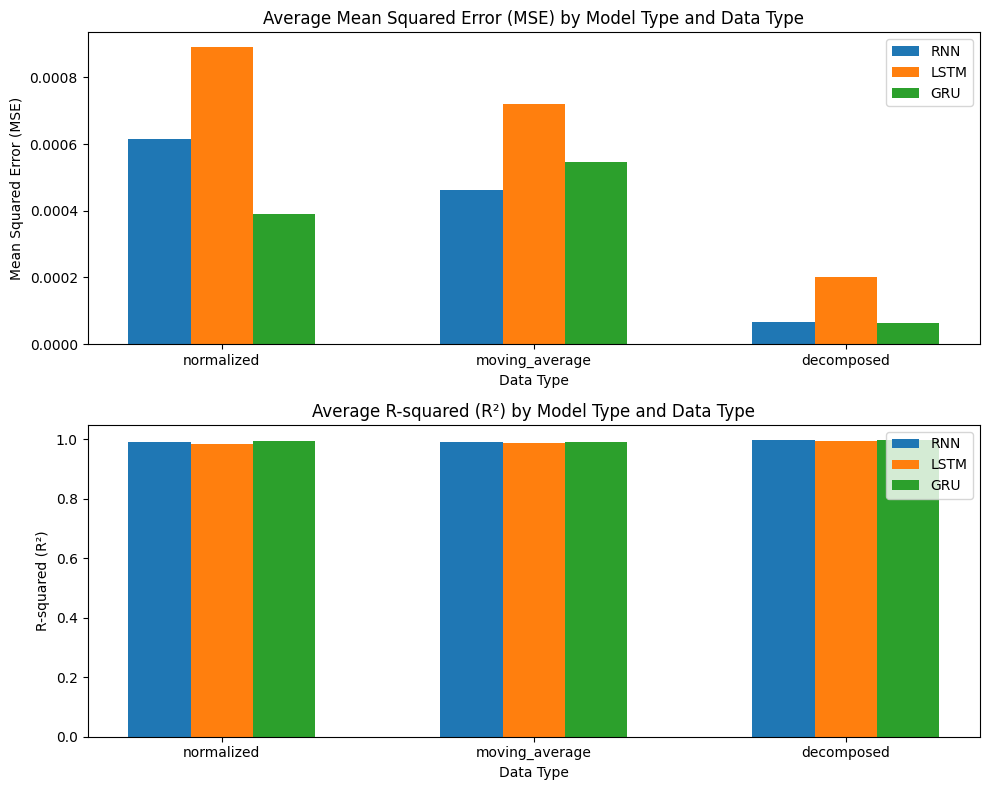

In [33]:
import matplotlib.pyplot as plt
import numpy as np

def plot_average_metrics(average_metrics):
    """
    Plots average MSE and R-squared scores for different model types and data types.

    Parameters:
    average_metrics (dict): A dictionary containing average MSE and R-squared scores.
    """
    # Prepare data for plotting
    data_types = list(average_metrics.keys())
    model_types = list(average_metrics[data_types[0]].keys())

    # Initialize figure
    fig, axs = plt.subplots(2, 1, figsize=(10, 8))

    # Plot Average MSE
    mse_data = {model_type: [] for model_type in model_types}
    for data_type in data_types:
        for model_type in model_types:
            mse_data[model_type].append(average_metrics[data_type][model_type][0])

    x = np.arange(len(data_types))
    width = 0.2
    for i, model_type in enumerate(model_types):
        axs[0].bar(x + i*width, mse_data[model_type], width, label=model_type)

    axs[0].set_xlabel('Data Type')
    axs[0].set_ylabel('Mean Squared Error (MSE)')
    axs[0].set_title('Average Mean Squared Error (MSE) by Model Type and Data Type')
    axs[0].set_xticks(x + width * (len(model_types) / 2 - 0.5))
    axs[0].set_xticklabels(data_types)
    axs[0].legend()

    # Plot Average R-squared
    r2_data = {model_type: [] for model_type in model_types}
    for data_type in data_types:
        for model_type in model_types:
            r2_data[model_type].append(average_metrics[data_type][model_type][1])

    for i, model_type in enumerate(model_types):
        axs[1].bar(x + i*width, r2_data[model_type], width, label=model_type)

    axs[1].set_xlabel('Data Type')
    axs[1].set_ylabel('R-squared (R²)')
    axs[1].set_title('Average R-squared (R²) by Model Type and Data Type')
    axs[1].set_xticks(x + width * (len(model_types) / 2 - 0.5))
    axs[1].set_xticklabels(data_types)
    axs[1].legend()

    plt.tight_layout()
    plt.show()

# Calculate average metrics
average_metrics = calculate_average_metrics(metrics)

# Plot average metrics
plot_average_metrics(average_metrics)


In [34]:
import pickle

def save_all_lstm_models_to_single_file(results, filename='all_lstm_models.pkl'):
    model_dict = {}

    for stock_name, stock_data in results['decomposed'].items():
        lstm_model = stock_data['LSTM'][0]
        if lstm_model is not None:
            model_dict[stock_name] = lstm_model
        else:
            print(f'LSTM model for {stock_name} is not available.')

    # Serialize the dictionary with all models
    with open(filename, 'wb') as file:
        pickle.dump(model_dict, file)
    print(f'All models saved to {filename}')

# Call the function to save all models
save_all_lstm_models_to_single_file(results)


All models saved to all_lstm_models.pkl


In [35]:
import pickle

def load_all_lstm_models(filename='all_lstm_models.pkl'):
    try:
        with open(filename, 'rb') as file:
            model_dict = pickle.load(file)
        print(f'All models loaded successfully from {filename}.')
        return model_dict
    except Exception as e:
        print(f'Error loading models from {filename}: {e}')
        return None

# Example usage
all_models = load_all_lstm_models()
# Access a specific model by stock name
model_A = all_models.get('A')  # Replace 'A' with your stock name


All models loaded successfully from all_lstm_models.pkl.


In [36]:
pip install dash plotly tensorflow pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 58.6 MB/s eta 0:00:00


In [37]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.graph_objs as go
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model
import pickle

# Load all models and results from the training process
with open('all_lstm_models.pkl', 'rb') as file:
    all_models = pickle.load(file)

# Assuming 'results' from your previous training code is available and includes all the trained models
# Example: results['normalized']['AAPL']['LSTM'] contains the trained LSTM model for normalized data for Apple stock
# This should ideally be loaded from a pickle file or similar.

# Parameters
seq_length = 20  # Input sequence length for LSTM

# Create Dash app
app = dash.Dash(__name__)

# Layout of the Dash app
app.layout = html.Div(children=[
    html.H1(children='Stock Prediction Dashboard', style={'textAlign': 'center', 'color': '#007ACC'}),

    # Dropdown to select stock
    html.Label('Select Stock:', style={'fontSize': 18}),
    dcc.Dropdown(
        id='stock-dropdown',
        options=[{'label': stock_name, 'value': stock_name} for stock_name in results['normalized'].keys()],
        value=list(results['normalized'].keys())[0],  # Default value (first stock)
        style={'width': '50%', 'margin': '0 auto'}
    ),

    # Dropdown to select model type
    html.Label('Select Model Type:', style={'fontSize': 18}),
    dcc.Dropdown(
        id='model-type-dropdown',
        options=[
            {'label': 'RNN', 'value': 'RNN'},
            {'label': 'LSTM', 'value': 'LSTM'},
            {'label': 'GRU', 'value': 'GRU'}
        ],
        value='LSTM',  # Default value
        style={'width': '50%', 'margin': '0 auto'}
    ),

    # Summary of selected stock
    html.Div(id='stock-summary', style={'margin': '20px', 'textAlign': 'center', 'fontSize': 16}),

    # Graph to display the predictions
    dcc.Graph(id='predicted-graph', style={'height': '600px'})
])

# Callback to update summary and graph based on selected stock and model type
@app.callback(
    [Output('stock-summary', 'children'),
     Output('predicted-graph', 'figure')],
    [Input('stock-dropdown', 'value'),
     Input('model-type-dropdown', 'value')]
)
def update_dashboard(selected_stock, selected_model_type):
    # Retrieve the model and data from the results dictionary
    model, history, X_test, y_test, title = results['normalized'][selected_stock][selected_model_type]

    # Use the model to predict stock prices on the test data
    y_pred = model.predict(X_test)

    # Create a DataFrame for the test data and predictions to plot them together
    test_dates = pd.date_range(start='2016-01-01', periods=len(y_test), freq='D')  # Dummy dates
    predictions_df = pd.DataFrame({
        'Date': test_dates,
        'Actual': y_test.flatten(),
        'Predicted': y_pred.flatten()
    })

    # Create the prediction graph
    figure = {
        'data': [
            go.Scatter(
                x=predictions_df['Date'],
                y=predictions_df['Actual'],
                mode='lines',
                name='Actual Prices',
                line=dict(color='#1f77b4')  # Blue line for actual prices
            ),
            go.Scatter(
                x=predictions_df['Date'],
                y=predictions_df['Predicted'],
                mode='lines',
                name='Predicted Prices',
                line=dict(color='#ff7f0e')  # Orange line for predicted prices
            )
        ],
        'layout': go.Layout(
            title=f'Actual vs Predicted Prices for {selected_stock} using {selected_model_type}',
            xaxis={'title': 'Date'},
            yaxis={'title': 'Price'},
            plot_bgcolor='#F9F9F9',
            paper_bgcolor='#F9F9F9',
            font=dict(color='#333'),
            hovermode='x'
        )
    }

    # Update summary
    summary = f'Selected Stock: {selected_stock}, Model Type: {selected_model_type}'

    return summary, figure

# Run the Dash app
if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>